## Import libraries

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from numba import jit
from scipy import ndimage as ndi

## Show multiple images

In [2]:
def show_images(images, titles, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(cols*3, rows*3))
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i], cmap = "gray")
            ax.set_title(titles[i])
        ax.axis('off')
    plt.tight_layout()
    plt.show()

## Color spaces

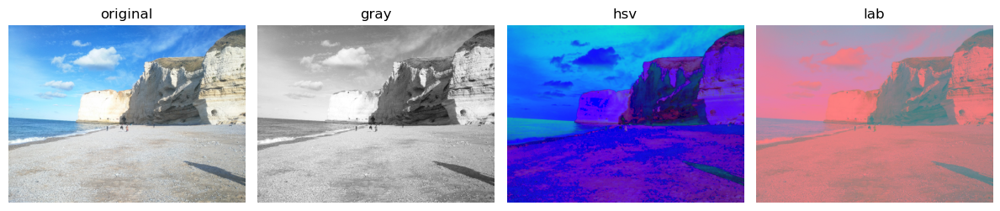

In [3]:
img = cv2.imread('images/sea.jpeg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

show_images([img, gray, hsv, lab],["original", "gray", "hsv", "lab"], 1, 4)

## Resizing

In [4]:
scale = 0.5       # half the original size

height = int(img.shape[0] * scale)
width  = int(img.shape[1] * scale)
dim = (width, height)

resized_img_1 = cv2.resize(img,dim)


resized_img_2 = cv2.resize(img, (500,500))

print(img.shape, resized_img_1.shape, resized_img_2.shape)

(900, 1200, 3) (450, 600, 3) (500, 500, 3)


## Cropping

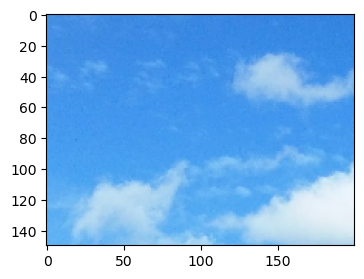

In [5]:
cropped = img[50:200, 200:400]

plt.figure(figsize=(10,3))
plt.imshow(cropped)

## Flipping

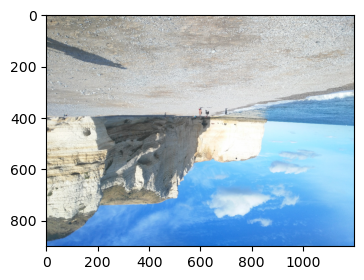

In [6]:
flip = cv2.flip(img, -1)  # ( 0 --> vertical flip) , ( 1 --> horizontal flip) , ( -1 --> both)

plt.figure(figsize=(10,3))
plt.imshow(flip)

## Translation

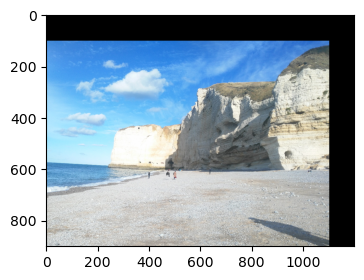

In [7]:
def translate(img, x, y):
    transMat = np.float32([[1,0,x],[0,1,y]])
    dimensions = (img.shape[1], img.shape[0])
    return cv2.warpAffine(img, transMat, dimensions)

# -x --> Left
# -y --> Up
# x --> Right
# y --> Down

translated = translate(img, -100, 100)

plt.figure(figsize=(10,3))
plt.imshow(translated)

## Rotation

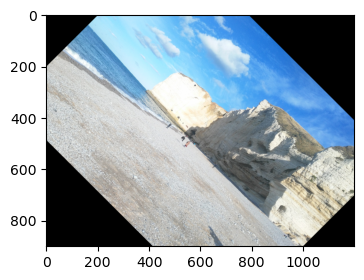

In [8]:
def rotate(img, angle, rotPoint=None):
    (height,width) = img.shape[:2]

    if rotPoint is None:
        rotPoint = (width//2,height//2)
    
    rotMat = cv2.getRotationMatrix2D(rotPoint, angle, 1.0)
    dimensions = (width,height)

    return cv2.warpAffine(img, rotMat, dimensions)

rotated = rotate(img, -45) # clockwise rotation

plt.figure(figsize=(10,3))
plt.imshow(rotated)

## Draw

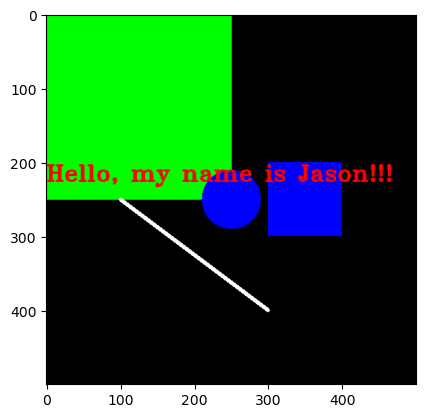

In [9]:
blank = np.zeros((500,500,3), dtype='uint8') # BLACK IMAGE

# 1. Paint the image a certain colour
blank[200:300, 300:400] = 0,0,255

# 2. Draw a Rectangle
cv2.rectangle(blank, (0,0), (blank.shape[1]//2, blank.shape[0]//2), (0,255,0), thickness=-1)

# 3. Draw A circle
cv2.circle(blank, (blank.shape[1]//2, blank.shape[0]//2), 40, (0,0,255), thickness=-1)

# 4. Draw a line
cv2.line(blank, (100,250), (300,400), (255,255,255), thickness=3)

# 5. Write text
cv2.putText(blank, 'Hello, my name is Jason!!!', (0,225), cv2.FONT_HERSHEY_TRIPLEX, 1.0, (255,0,0), 2)

plt.imshow(blank)

## Blurring

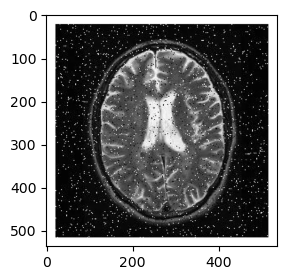

In [10]:
salt = cv2.imread('images/salt.webp')
plt.figure(figsize=(10,3))
plt.imshow(salt)

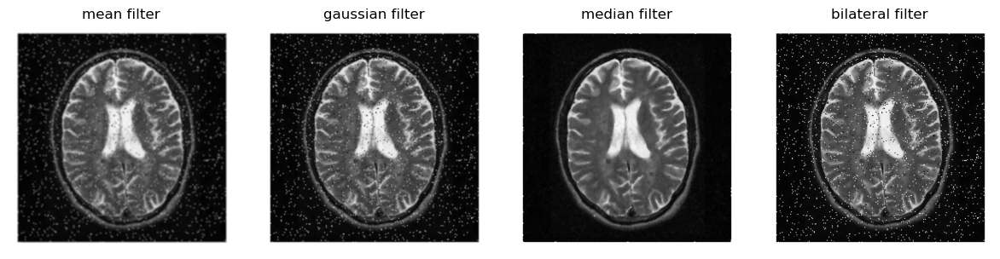

In [11]:
mean_filter = cv2.blur(salt,(5,5))
gaussian_filter = cv2.GaussianBlur(salt,(5,5),0)    # 0 is the standard deviation 
median_filter = cv2.medianBlur(salt,5)
bilateral_filter = cv2.bilateralFilter(salt, 9, 75, 75)

show_images([mean_filter, gaussian_filter, median_filter, bilateral_filter],\
            ["mean filter", "gaussian filter", "median filter", "bilateral filter"], 1, 4)

## Thresholding

optimal threshold from otsu = 176.0


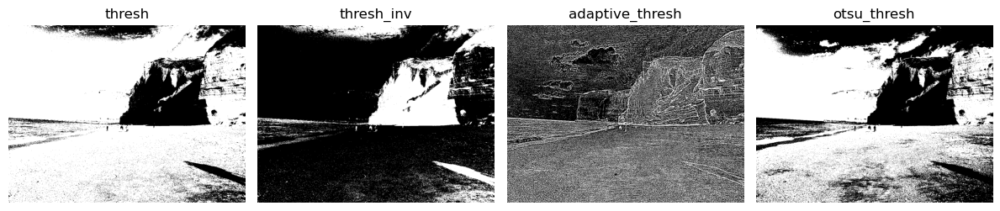

In [12]:
# Simple Thresholding
threshold, thresh = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY )

threshold, thresh_inv = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY_INV )

# Adaptive Thresholding
adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

# Otsu thresholding
optimal_thresh,otsu_thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
print(f"optimal threshold from otsu = {optimal_thresh}")

show_images([thresh, thresh_inv, adaptive_thresh, otsu_thresh],["thresh", "thresh_inv", "adaptive_thresh", "otsu_thresh"], 1, 4)

## contours

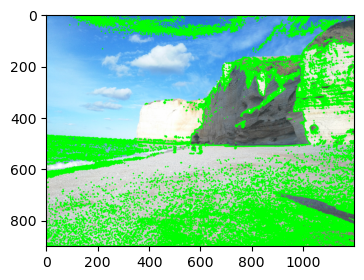

In [13]:
# Find contours for the thresholded image
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

'''
The first parameter is the binary image on which contours will be found.
The second parameter is the contour retrieval mode. This can be set to one of several options,
    including cv2.RETR_TREE, which retrieves all of the contours and reconstructs a full hierarchy of nested contours.
The third parameter is the contour approximation method.
    This can be set to one of several options, including
    CHAIN_APPROX_SIMPLE: compresses horizontal, vertical, and diagonal segments and leaves only their end points.
                             For example, an up-right rectangular contour is encoded with 4 points.
    CHAIN_APPROX_NONE: stores absolutely all the contour points
'''
# Draw contours on the image
image = img.copy()
cv2.drawContours(image, contours, -1, (0, 255, 0), 3)

'''
The first parameter is the image on which contours will be drawn.
The second parameter is a list of contours to be drawn.
The third parameter is the index of the contour to be drawn. A value of -1 means all contours will be drawn.
The fourth parameter is the color of the contour in BGR format.
The fifth parameter is the thickness of the contour in pixels.
'''
plt.figure(figsize=(10,3))
plt.imshow(image)

# Detect Simple Geometric Shapes

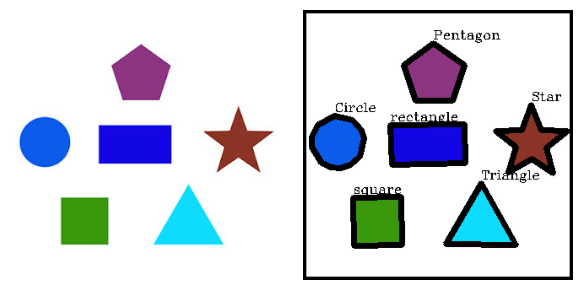

In [7]:
image = cv2.imread('images/shapes.jpg')
img = image.copy()
imgGrey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

_, thresh = cv2.threshold(imgGrey, 240, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

for contour in contours:
    approx = cv2.approxPolyDP(contour, 0.01* cv2.arcLength(contour, True), True)     
    
    cv2.drawContours(img, [approx], 0, (0, 0, 0), 5)          

    x = approx.ravel()[0]          
    y = approx.ravel()[1] - 5           

    if len(approx) == 3:          
        cv2.putText(img, "Triangle", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.5, (0, 0, 0))               
    elif len(approx) == 4 :         
        x1 ,y1, w, h = cv2.boundingRect(approx)                
        aspectRatio = float(w)/h                
        if aspectRatio >= 0.95 and aspectRatio <= 1.05:               
          cv2.putText(img, "square", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.5, (0, 0, 0))                
        else:                
          cv2.putText(img, "rectangle", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.5, (0, 0, 0))                     
    elif len(approx) == 5:           
        cv2.putText(img, "Pentagon", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.5, (0, 0, 0))                
    elif len(approx) == 10:           
        cv2.putText(img, "Star", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.5, (0, 0, 0))                
    else:            
        cv2.putText(img, "Circle", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.5, (0, 0, 0))                 

show_images([image, img],["", ""], 1, 2)

# Graham scan(Convex Hull)

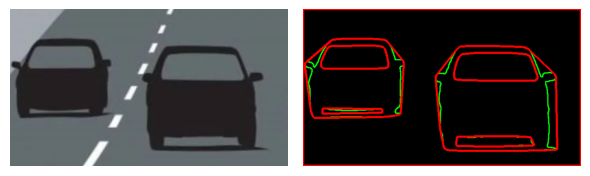

In [26]:
image = cv2.imread('images/cars.png')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Threshold the image to get a binary image
_, thresh = cv2.threshold(gray, 50, 255, cv2.THRESH_BINARY)

# Find contours
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Calculate the convex hull for each contour
hull = [cv2.convexHull(c) for c in contours]

# Draw contours and hull
drawing = np.zeros((thresh.shape[0], thresh.shape[1], 3), dtype=np.uint8)
for i in range(len(contours)):
    color_contours = (0, 255, 0)  # Green for contours
    color_hull = (255, 0, 0)  # Blue for convex hull
    cv2.drawContours(drawing, contours, i, color_contours, 2)
    cv2.drawContours(drawing, hull, i, color_hull, 3)

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
show_images([image, drawing],["", ""], 1, 2)

## Split the image to it's three channels

Text(0.5, 1.0, 'blue')

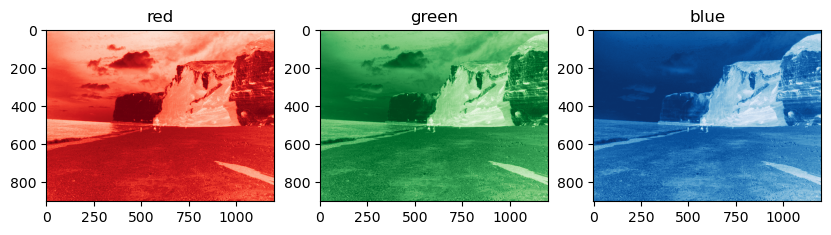

In [14]:
r, g, b = cv2.split(img)

# Another way
# r = img[:,:,0]
# g = img[:,:,1]
# b = img[:,:,2]

plt.figure(figsize=(10,3))
plt.subplot(131)
plt.imshow(r, cmap = "Reds")
plt.title('red')

plt.subplot(132)
plt.imshow(g, cmap = "Greens")
plt.title('green')

plt.subplot(133)
plt.imshow(b, cmap = "Blues")
plt.title('blue')

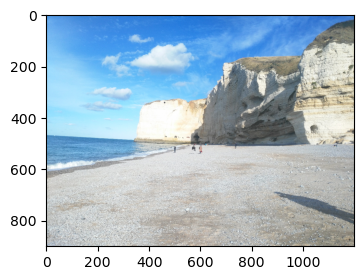

In [15]:
merged_image=cv2.merge([r, g, b])
plt.figure(figsize=(10,3))
plt.imshow(merged_image)

## bitwise

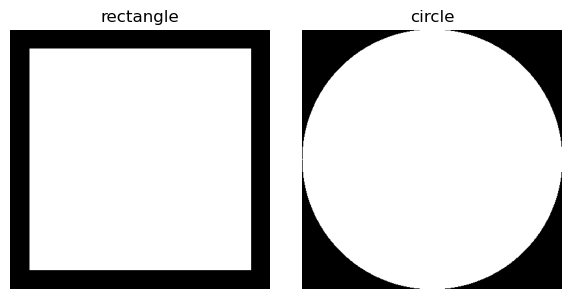

In [17]:
blank = np.zeros((400,400), dtype='uint8')

rectangle = cv2.rectangle(blank.copy(), (30,30), (370,370), 255, -1)
circle = cv2.circle(blank.copy(), (200,200), 200, 255, -1)

show_images([rectangle, circle],["rectangle", "circle"], 1, 2)

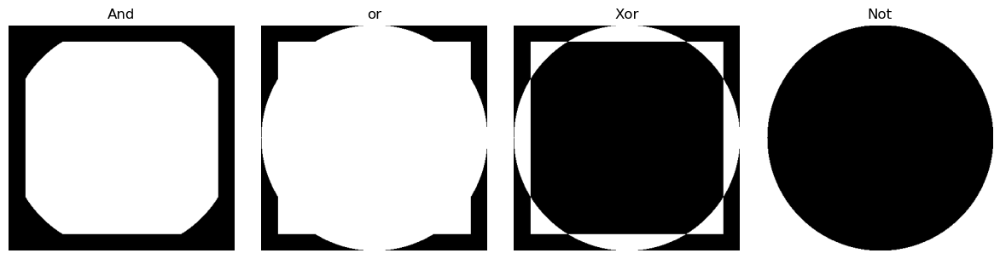

In [18]:
# bitwise AND --> intersecting regions
bitwise_and = cv2.bitwise_and(rectangle, circle)

# bitwise OR --> non-intersecting and intersecting regions
bitwise_or = cv2.bitwise_or(rectangle, circle)

# bitwise XOR --> non-intersecting regions
bitwise_xor = cv2.bitwise_xor(rectangle, circle)

# bitwise NOT
bitwise_not = cv2.bitwise_not(circle)

show_images([bitwise_and, bitwise_or, bitwise_xor, bitwise_not],["And", "or", "Xor", "Not"], 1, 4)

## Masking

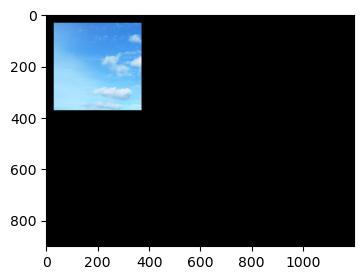

In [19]:
blank = np.zeros(img.shape[:2], dtype='uint8')

circle = cv2.circle(blank.copy(), (img.shape[1]//2 + 45,img.shape[0]//2), 100, 255, -1)

rectangle = cv2.rectangle(blank.copy(), (30,30), (370,370), 255, -1)


masked = cv2.bitwise_and(img, img, mask = rectangle)

plt.figure(figsize=(10,3))
plt.imshow(masked)

## Histogram

<BarContainer object of 256 artists>

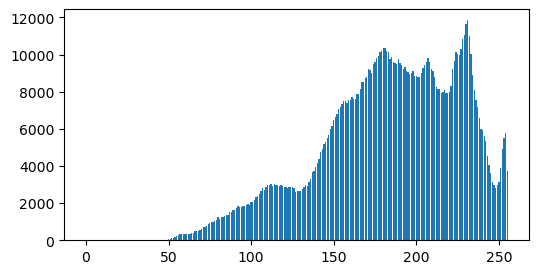

In [20]:
hist, bins = np.histogram(gray,256,[0,256])

plt.figure(figsize=(6,3))
plt.bar(x = range(256), height = hist)

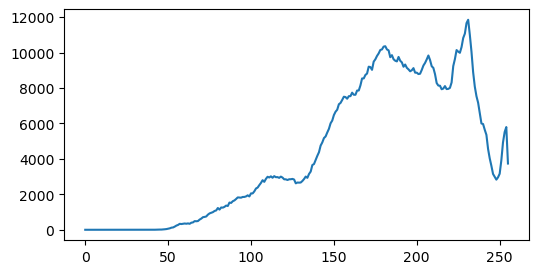

In [21]:
hist_gray = cv2.calcHist([gray], [0], None, [256], [0, 256])
plt.figure(figsize=(6,3))
plt.plot(hist_gray)

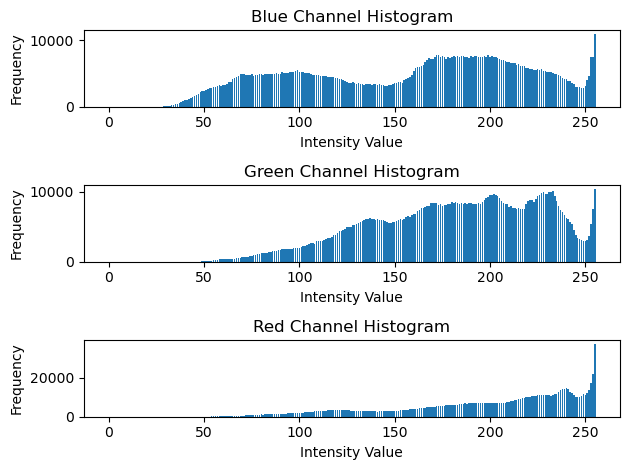

In [22]:
b, g, r = cv2.split(img)

# Calculate the histograms for each color channel
hist_b, bins_b = np.histogram(b.ravel(), 256, [0, 256])
hist_g, bins_g = np.histogram(g.ravel(), 256, [0, 256])
hist_r, bins_r = np.histogram(r.ravel(), 256, [0, 256])

# Display the histograms for each color channel
plt.figure()
plt.subplot(311)
plt.bar(range(256), hist_b)
plt.xlabel('Intensity Value')
plt.ylabel('Frequency')
plt.title('Blue Channel Histogram')

plt.subplot(312)
plt.bar(range(256), hist_g)
plt.xlabel('Intensity Value')
plt.ylabel('Frequency')
plt.title('Green Channel Histogram')

plt.subplot(313)
plt.bar(range(256), hist_r)
plt.xlabel('Intensity Value')
plt.ylabel('Frequency')
plt.title('Red Channel Histogram')

plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

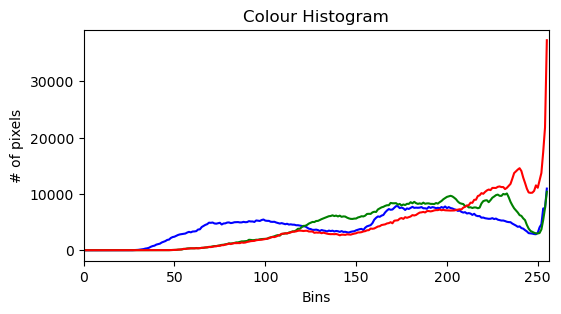

In [23]:
plt.figure()
plt.figure(figsize=(6,3))
plt.title('Colour Histogram')
plt.xlabel('Bins')
plt.ylabel('# of pixels')
colors = ('b', 'g', 'r')
for i,col in enumerate(colors):
    hist = cv2.calcHist([img], [i], None, [256], [0,256])
    plt.plot(hist, color=col)
    plt.xlim([0,256])

plt.show()

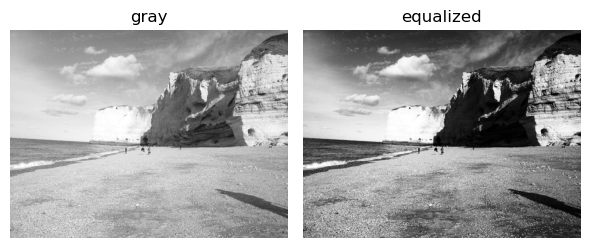

In [24]:
eq = cv2.equalizeHist(gray)

show_images([gray, eq],["gray", "equalized"], 1, 2)

<BarContainer object of 256 artists>

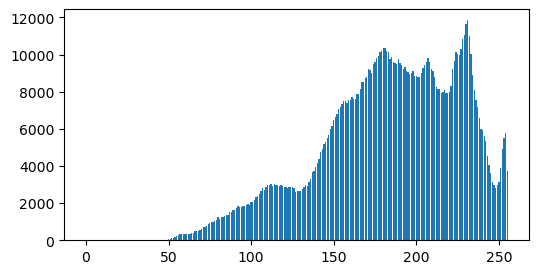

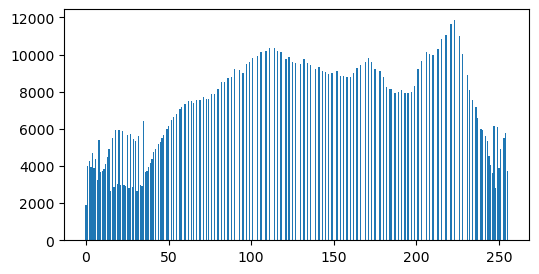

In [25]:
hist, bins = np.histogram(gray,256,[0,256])

plt.figure(figsize=(6,3))
plt.bar(x = range(256), height = hist)

hist, bins = np.histogram(eq,256,[0,256])

plt.figure(figsize=(6,3))
plt.bar(x = range(256), height = hist)

# Morphological Operations

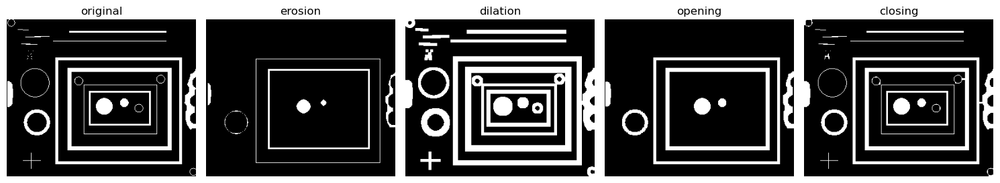

In [52]:
image = cv2.imread('images/morph_1.png', cv2.IMREAD_GRAYSCALE)
_, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Create a kernel
kernel = np.ones((5,5), np.uint8)

# Perform Erosion
erosion = cv2.erode(binary_image, kernel, iterations = 1)

# Perform Dilation
dilation = cv2.dilate(binary_image, kernel, iterations = 1)

# Perform Opening (erosion followed by dilation)
opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)

# Perform Closing (dilation followed by erosion)
closing = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)

show_images([binary_image, erosion, dilation, opening, closing],["original", "erosion", "dilation", "opening", "closing"], 1, 5)


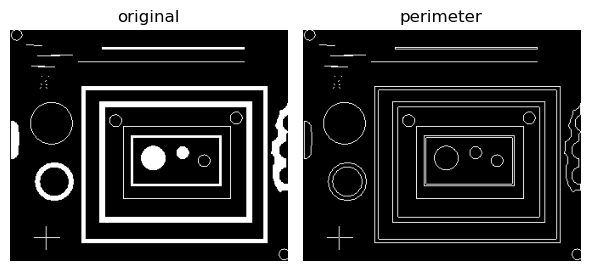

In [54]:
# Find contours
contours, _ = cv2.findContours(binary_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

# Create an empty image to draw the contours
perimeter_image = np.zeros_like(binary_image)

# Draw the contours on the empty image
cv2.drawContours(perimeter_image, contours, -1, (255), 1)

#plt.imshow(binary_image)
#plt.imshow(perimeter_image, cmap="gray")
show_images([binary_image, perimeter_image],["original", "perimeter"], 1, 2)

# Image Pyramids And Laplacian Pyramids

(320, 320, 3)
(160, 160, 3)
(80, 80, 3)


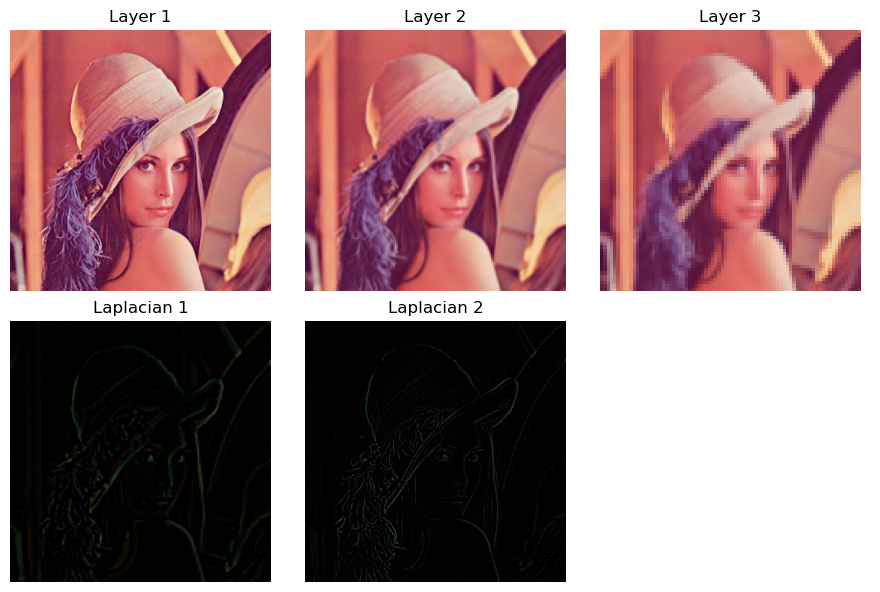

In [5]:
img = cv2.imread("images/lena.jpg")

layer = img.copy()
layer = cv2.cvtColor(layer.astype(np.uint8), cv2.COLOR_BGR2RGB)
print(layer.shape)
gaussian_pyramid_list = [layer]

for i in range(2):
    layer = cv2.pyrDown(layer)     
    gaussian_pyramid_list.append(layer)
    print(layer.shape)

layer = gaussian_pyramid_list[1]

laplacian_pyramid_list = []

for i in range(2, 0, -1):
    gaussian_extended = cv2.pyrUp(gaussian_pyramid_list[i])     
    laplacian = cv2.subtract(gaussian_pyramid_list[i-1], gaussian_extended)
    laplacian_pyramid_list.append(laplacian)

images = gaussian_pyramid_list + laplacian_pyramid_list
titles = ["Layer 1", "Layer 2", "Layer 3", "Laplacian 1", "Laplacian 2",]
show_images(images, titles, 2, 3)

# Image Blending using Pyramids

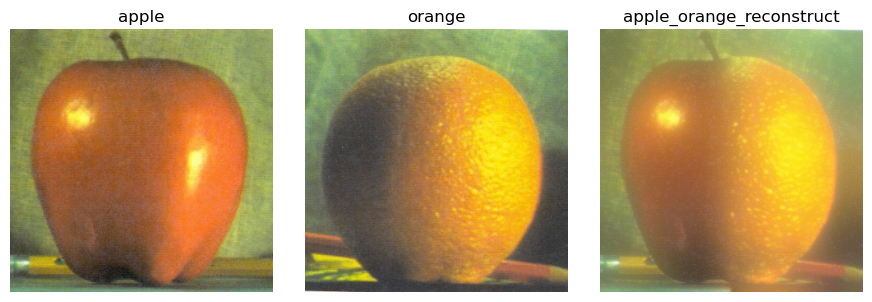

In [8]:
apple = cv2.imread('images/apple.jpg')
orange = cv2.imread('images/orange.jpg')

apple = cv2.cvtColor(apple.astype(np.uint8), cv2.COLOR_BGR2RGB)
orange = cv2.cvtColor(orange.astype(np.uint8), cv2.COLOR_BGR2RGB)

apple_orange = np.hstack((apple[:, :256], orange[:, 256:]))

# generate Gaussian pyramid for apple
apple_copy = apple.copy()
gp_apple = [apple_copy]
for i in range(6):
    apple_copy = cv2.pyrDown(apple_copy)       
    gp_apple.append(apple_copy)       

# generate Gaussian pyramid for orange
orange_copy = orange.copy()
gp_orange = [orange_copy]
for i in range(6):
    orange_copy = cv2.pyrDown(orange_copy)      
    gp_orange.append(orange_copy)      

# generate Laplacian Pyramid for apple
apple_copy = gp_apple[5]
lp_apple = [apple_copy]
for i in range(5, 0, -1):
    gaussian_expanded = cv2.pyrUp(gp_apple[i])      
    laplacian = cv2.subtract(gp_apple[i-1], gaussian_expanded)      
    lp_apple.append(laplacian)      

# generate Laplacian Pyramid for orange
orange_copy = gp_orange[5]
lp_orange = [orange_copy]
for i in range(5, 0, -1):
    gaussian_expanded = cv2.pyrUp(gp_orange[i])      
    laplacian = cv2.subtract(gp_orange[i-1], gaussian_expanded)      
    lp_orange.append(laplacian)      

# Now add left and right halves of images in each level
apple_orange_pyramid = []
n = 0

for apple_lap, orange_lap in zip(lp_apple, lp_orange):
    n += 1      
    cols, rows, ch = apple_lap.shape     
    laplacian = np.hstack((apple_lap[:, 0:int(cols/2)], orange_lap[:, int(cols/2):]))     
    apple_orange_pyramid.append(laplacian)     

# now reconstruct
apple_orange_reconstruct = apple_orange_pyramid[0]
for i in range(1, 6):
    apple_orange_reconstruct = cv2.pyrUp(apple_orange_reconstruct)       
    apple_orange_reconstruct = cv2.add(apple_orange_pyramid[i], apple_orange_reconstruct)       


show_images([apple, orange, apple_orange_reconstruct],["apple", "orange", "apple_orange_reconstruct"], 1, 3)

# Edge detection

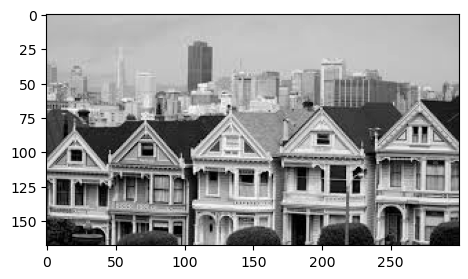

In [26]:
image = cv2.imread('images/edge.jpg')
gray_image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
image = cv2.GaussianBlur(gray_image,(3,3),0)

plt.figure(figsize=(10,3))
plt.imshow(gray_image, cmap = 'gray')

## Prewitt

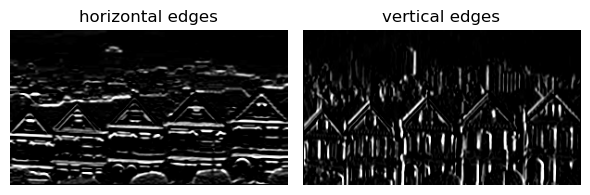

In [27]:
kernelx = np.array([[1 , 1 , 1], 
                    [0 , 0 , 0], 
                    [-1,-1 ,-1]])
kernely = np.array([[-1 ,0,1],
                    [-1 ,0,1],
                    [-1 ,0,1]])
img_prewittx = cv2.filter2D(image, -1, kernelx)
img_prewitty = cv2.filter2D(image, -1, kernely)

show_images([img_prewittx, img_prewitty],["horizontal edges", "vertical edges"], 1, 2)

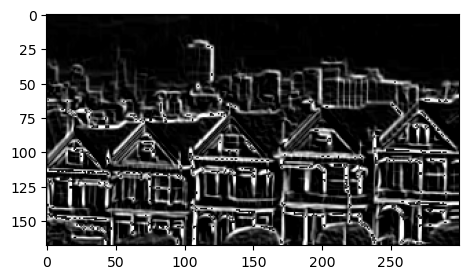

In [28]:
plt.figure(figsize=(10,3))
plt.imshow(img_prewittx + img_prewitty , cmap = 'gray')

## Sobel

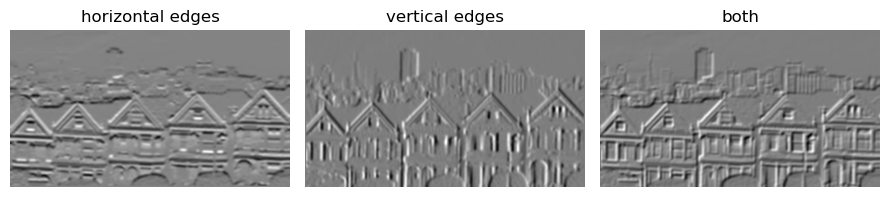

In [29]:
sobely = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = 5)
sobelx = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize = 5)

'''
image: This is the input image on which the Sobel operation is to be applied.
    It should be a single-channel (grayscale) or three-channel (RGB) image.

cv2.CV_64F: This specifies the data type of the output image. It is set to cv2.CV_64F,
    which indicates a 64-bit floating-point output. It is used to ensure that the output
    image can handle both positive and negative gradient values.

1 and 0 in the third and fourth parameters: These represent the order of the derivative in the x and y direction,
    respectively. In this case, 1 for x indicates that the derivative is taken in the horizontal (x) direction,
    and 0 for y indicates that no derivative is taken in the vertical (y) direction.

ksize: This specifies the size of the Sobel kernel, which determines the size of the aperture used for computing the gradient.
    In this case, ksize = 5 indicates a 5x5 Sobel kernel.
'''

show_images([sobelx, sobely, sobelx + sobely],["horizontal edges", "vertical edges", "both"], 1, 3)

## Canny

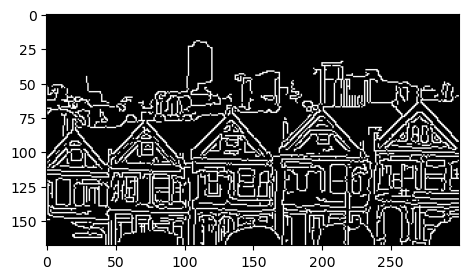

In [30]:
img_canny = cv2.Canny(image,100,200)

'''
image: This is the input image on which the edge detection is to be applied.
    It should be a single-channel 8-bit image (grayscale image).

threshold1: This is the first threshold value used for edge detection. It is a scalar value,
    typically an integer, which represents the lower threshold value. Any edges with gradient magnitude lower than this
    threshold will be rejected as weak edges.

threshold2: This is the second threshold value used for edge detection. It is also a scalar value,
    typically an integer, which represents the higher threshold value. Any edges with gradient magnitude higher than this
    threshold will be accepted as strong edges.
'''

plt.figure(figsize=(10,3))
plt.imshow(img_canny, cmap = 'gray')

## Laplacian Of Gaussian (LoG)

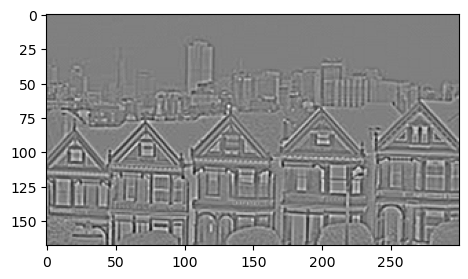

In [31]:
laplace_img = cv2.Laplacian(image, cv2.CV_64F)

plt.figure(figsize=(10,3))
plt.imshow(laplace_img, cmap = 'gray')

## Derivative Of Gaussian (DoG)

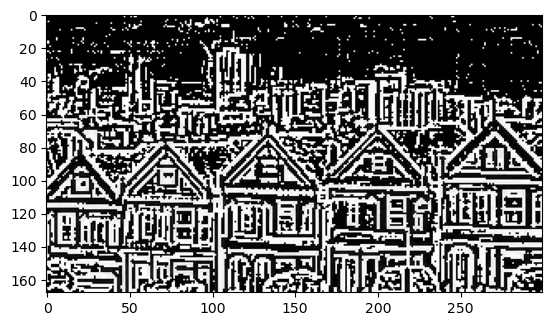

In [5]:

image = cv2.imread('images/edge.jpg', cv2.IMREAD_GRAYSCALE)

# Apply Gaussian Blur with different sigmas
blur1 = cv2.GaussianBlur(image, (5, 5), 1)
blur2 = cv2.GaussianBlur(image, (5, 5), 2)

# Subtract the two blurred images
dog = blur1 - blur2

# Convert to 8-bit image
dog = cv2.convertScaleAbs(dog)

plt.imshow(dog, cmap='gray')

# Fast Corner Detection

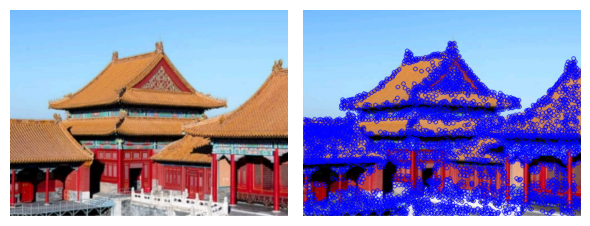

In [9]:
image = cv2.imread('images/town.jpeg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Initiate FAST detector
fast = cv2.FastFeatureDetector_create()

# Find and draw the keypoints
keypoints = fast.detect(gray, None)
image_with_keypoints = cv2.drawKeypoints(image, keypoints, None, (255, 0, 0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_with_keypoints = cv2.cvtColor(image_with_keypoints, cv2.COLOR_BGR2RGB)
show_images([image, image_with_keypoints],["", ""], 1, 2)

# Harris corner

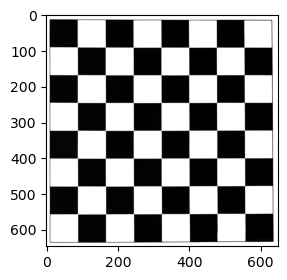

In [32]:
chess = cv2.imread('images/chess.jpeg')
gray_chess = cv2.cvtColor(chess, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(10,3))
plt.imshow(gray_chess, cmap = 'gray')

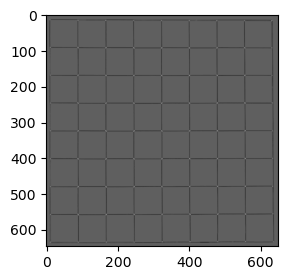

In [33]:
img = np.float32(gray_chess)

corner_img = cv2.cornerHarris(img, 2, 3, 0.04)

'''
src: Input image. It should be a single-channel grayscale image (uint8 or float32).
blockSize: Size of the neighborhood considered for corner detection. It is the size of the window used to compute
    the auto-correlation matrix M. It is an integer value and must be odd. Typical values are 3, 5, 7, etc.
ksize: Aperture parameter of the Sobel operator used to compute gradients. It is the size of the Sobel kernel used for
    gradient computation. It is an integer value and must be odd. Typical values are 3, 5, 7, etc.
k: Harris detector free parameter. It is a constant value in the Harris corner detection equation, usually set to
    a small value between 0.04 and 0.06.
'''

plt.figure(figsize=(10,3))
plt.imshow(corner_img, cmap = 'gray')

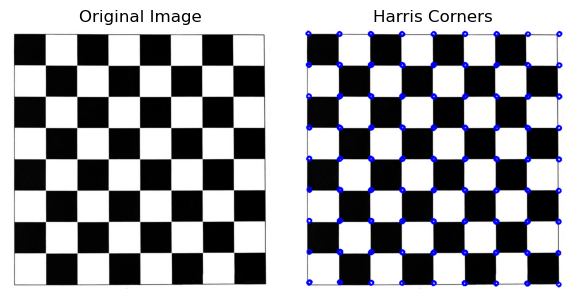

In [34]:
# Threshold the result to get the corner points
threshold = 0.01 * corner_img.max()
corner_points = np.argwhere(corner_img > threshold)

# Draw circles on the corners
for corner in corner_points:
    x, y = corner.ravel()
    cv2.circle(chess, (x, y), 5, (0, 0, 255), 2)

# Display the original image and the detected corners
show_images([cv2.imread('images/chess.jpeg'), chess],["Original Image", "Harris Corners"], 1, 2)

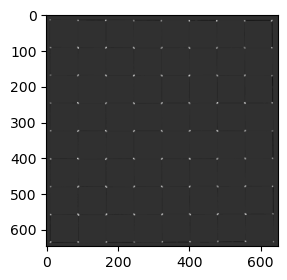

In [35]:
dilated_img = cv2.dilate(corner_img, None)

plt.figure(figsize=(10,3))
plt.imshow(dilated_img, cmap = 'gray')

# SIFT

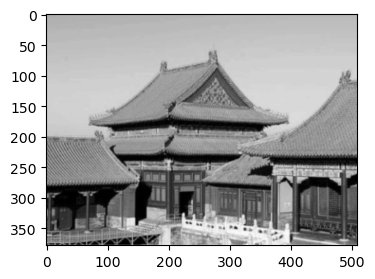

In [10]:
town = cv2.imread('images/town.jpeg')
gray_town = cv2.cvtColor(town, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(10,3))
plt.imshow(gray_town, cmap = 'gray')

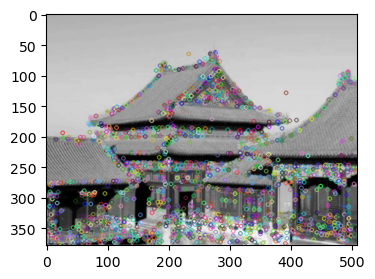

In [11]:
sift = cv2.SIFT_create()
key_points = sift.detect(gray_town, None)  # the second parameter is used to specify the mask or region of interest (ROI)
key_points_img = cv2.drawKeypoints(gray_town, key_points, town)

plt.figure(figsize=(10,3))
plt.imshow(key_points_img)

# Oriented FAST and Rotated BRIEF (ORB)

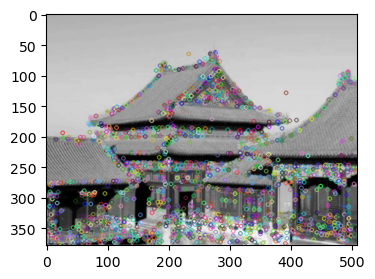

In [37]:
# Initiate ORB detector
orb = cv2.ORB_create()

# Find the keypoints with ORB
keypoints = orb.detect(gray_town, None)

# Compute the descriptors with ORB
keypoints, descriptors = orb.compute(gray_town, keypoints)

# Draw only keypoints location, not size and orientation
image_with_keypoints = cv2.drawKeypoints(gray_town, keypoints, None, color=(0, 255, 0), flags=0)

plt.figure(figsize=(10,3))
plt.imshow(key_points_img)

# Brute-Force Feature Matching

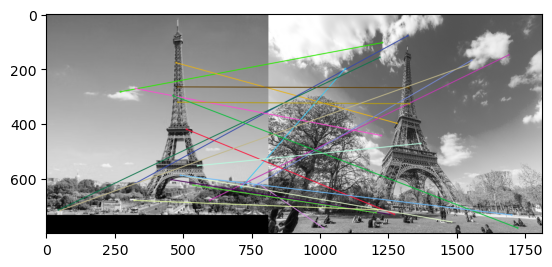

In [68]:
img1 = cv2.imread('images/eiffel_tower1.png')
img2 = cv2.imread('images/eiffel_tower2.jpg')

img2 = cv2.resize(img2,(1000,800))

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

#sift

sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2, None)

#feature matching using Brute-Force
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)


img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:20], img2, flags=2, matchesThickness = 2)



plt.imshow(img3)

# KD-tree Feature Matching

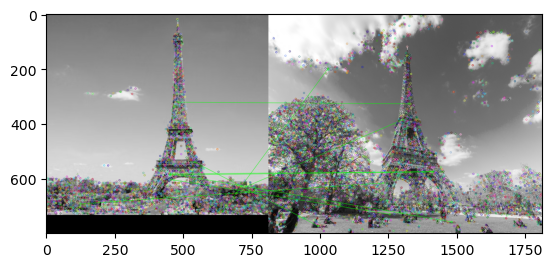

In [69]:
img1 = cv2.imread('images/eiffel_tower1.png')
img2 = cv2.imread('images/eiffel_tower2.jpg')

img2 = cv2.resize(img2,(1000,800))

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

#sift

sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2, None)

# Fast Library for Approximate Nearest Neighbors (FLANN) parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50) # or pass empty dictionary

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches = flann.knnMatch(descriptors_1,descriptors_2,k=2)

# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]

# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.7*n.distance:
        matchesMask[i]=[1,0]
    
draw_params = dict(matchColor = (0,255,0),
                   #singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = cv2.DrawMatchesFlags_DEFAULT)

img3 = cv2.drawMatchesKnn(img1,keypoints_1,img2,keypoints_2,matches,None,**draw_params)

plt.imshow(img3)

# Hough Line Transform

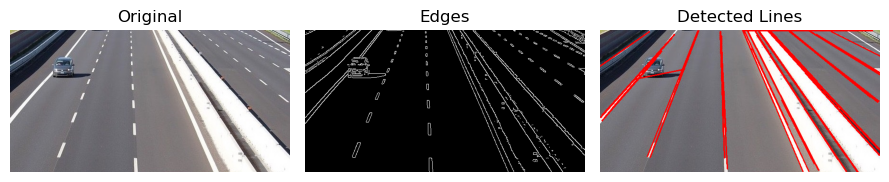

In [3]:
image = cv2.imread('images/road.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Canny edge detector
edges = cv2.Canny(gray, 200, 255)

# Apply Hough Line Transform
lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=40, minLineLength=100, maxLineGap=50)
'''
rho: Distance resolution of the accumulator in pixels. For example, a value of 1 means that the distance resolution is 1 pixel.
theta: Angle resolution of the accumulator in radians. For example, np.pi/180 means that the angle resolution is 1 degree.
threshold: The minimum number of intersections to detect a line. Only those lines are returned that get enough votes (greater than threshold).
'''

# Create a copy of the original image to draw lines
image_with_lines = image.copy()
lines_list =[]
# Step 5: Draw the lines
if lines is not None:
    for points in lines:
          # Extracted points nested in the list
        x1,y1,x2,y2=points[0]
        # Draw the lines joing the points
        # On the original image
        cv2.line(image_with_lines,(x1,y1),(x2,y2),(0,0,255),2)
        # Maintain a simples lookup list for points
        lines_list.append([(x1,y1),(x2,y2)])

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_with_lines = cv2.cvtColor(image_with_lines, cv2.COLOR_BGR2RGB)
show_images([image, edges, image_with_lines],["Original", "Edges", "Detected Lines"], 1, 3)

# Hough Circle Transform

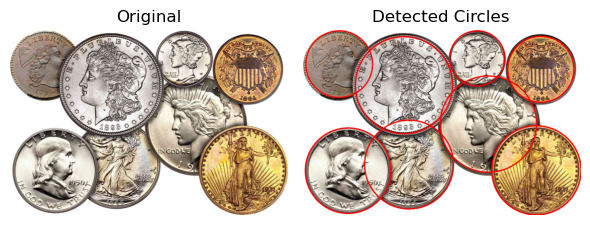

In [4]:
image = cv2.imread('images/coins.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Median Blur
gray = cv2.medianBlur(gray, 5)

# Step 4: Apply Hough Circle Transform
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, dp=1.2, minDist=300,
                           param1=200, param2=100, minRadius=100, maxRadius=300)
'''
gray: Input image (grayscale).
cv2.HOUGH_GRADIENT: Define the detection method. Currently, the only one available in OpenCV.
dp=1.2: The inverse ratio of the accumulator resolution to the image resolution.
minDist=50: Minimum distance between the centers of the detected circles.
param1=100: Higher threshold for the Canny edge detector.
param2=30: Accumulator threshold for the circle centers at the detection stage.
minRadius=0: Minimum circle radius.
maxRadius=0: Maximum circle radius.
'''
img_circles = image.copy()

# Draw the circles
if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0, :]:
        center = (i[0], i[1])  # center of the circle
        radius = i[2]  # radius of the circle
        cv2.circle(img_circles, center, 1, (0, 100, 100), 3)  # draw center
        cv2.circle(img_circles, center, radius, (0, 0, 255), 5)  # draw outline

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img_circles = cv2.cvtColor(img_circles, cv2.COLOR_BGR2RGB)
show_images([image, img_circles],["Original", "Detected Circles"], 1, 2)

# Detect Pedestrians Using Histogram of Oriented Gradients (HOG)

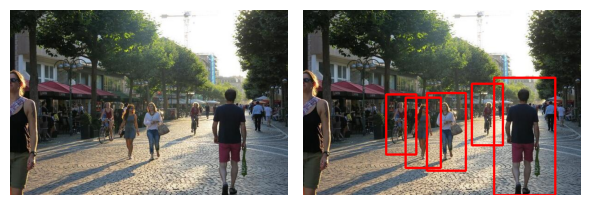

In [70]:
hog = cv2.HOGDescriptor()
 
# Initialize the People Detector
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
 
# Load an image
img = cv2.imread('images/pedestrians.jpg')
image = img.copy()   
# Detect people
# image: Source image
# winStride: step size in x and y direction of the sliding window
# padding: no. of pixels in x and y direction for padding of sliding window
# scale: Detection window size increase coefficient   
# bounding_boxes: Location of detected people
# weights: Weight scores of detected people
(bounding_boxes, weights) = hog.detectMultiScale(image, 
                                               winStride=(4, 4),
                                               padding=(8, 8), 
                                               scale=1.05)

# Draw bounding boxes on the image
for (x, y, w, h) in bounding_boxes: 
    cv2.rectangle(image, (x, y),  (x + w, y + h),  (0, 0, 255), 4)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
show_images([img, image],["", ""], 1, 2)

# Reinhard Color Transfer

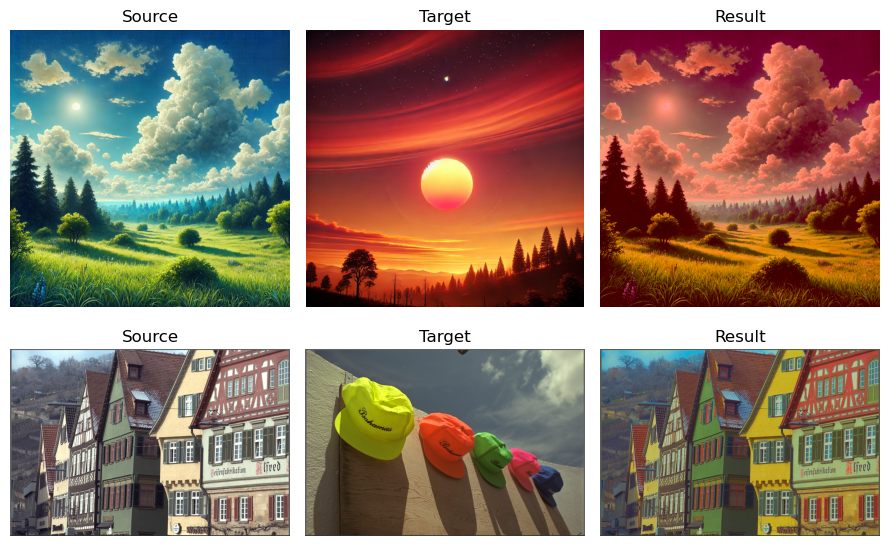

In [17]:
def get_mean_and_std(x):
	x_mean, x_std = cv2.meanStdDev(x)
	x_mean = np.hstack(np.around(x_mean,2))
	x_std = np.hstack(np.around(x_std,2))
	return x_mean, x_std

def color_transfer(source, target):
    s = cv2.cvtColor(source,cv2.COLOR_BGR2LAB)
    t = cv2.cvtColor(target,cv2.COLOR_BGR2LAB)

    s_mean, s_std = get_mean_and_std(s)
    t_mean, t_std = get_mean_and_std(t)

    height, width, channel = s.shape
    for i in range(0,height):
        for j in range(0,width):
            for k in range(0,channel):
                x = s[i,j,k]
                x = ((x-s_mean[k])*(t_std[k]/s_std[k]))+t_mean[k]
                # round or +0.5
                x = round(x)
                # boundary check
                x = 0 if x<0 else x
                x = 255 if x>255 else x
                s[i,j,k] = x

    result_image = cv2.cvtColor(s,cv2.COLOR_LAB2RGB)
    return result_image

source_image1 = cv2.imread('images/s1.png')
target_image1 = cv2.imread('images/t1.png')
result_image1 = reinhard_color_transfer(source_image1, target_image1)

source_image2 = cv2.imread('images/s2.bmp')
target_image2 = cv2.imread('images/t2.bmp')
result_image2 = reinhard_color_transfer(source_image2, target_image2)

source_image1 = cv2.cvtColor(source_image1,cv2.COLOR_BGR2RGB)
target_image1 = cv2.cvtColor(target_image1,cv2.COLOR_BGR2RGB)
source_image2 = cv2.cvtColor(source_image2,cv2.COLOR_BGR2RGB)
target_image2 = cv2.cvtColor(target_image2,cv2.COLOR_BGR2RGB)

# Save the result
show_images([source_image1, target_image1, result_image1 ,source_image2, target_image2, result_image2],
            ["Source", "Target", "Result" ,"Source", "Target", "Result"], 2, 3)

# Seam Carving

In [4]:
#https://github.com/andrewdcampbell/seam-carving/tree/master

SEAM_COLOR = np.array([255, 200, 200])
SHOULD_DOWNSIZE = True
DOWNSIZE_WIDTH = 500
ENERGY_MASK_CONST = 100000.0
MASK_THRESHOLD = 10
USE_FORWARD_ENERGY = True


def visualize(im, boolmask=None, rotate=False):
    vis = im.astype(np.uint8)
    if boolmask is not None:
        vis[np.where(boolmask == False)] = SEAM_COLOR
    if rotate:
        vis = rotate_image(vis, False)
    cv2.imshow("visualization", vis)
    cv2.waitKey(1)
    return vis

def resize(image, width):
    h, w = image.shape[:2]
    dim = (width, int(h * width / float(w)))
    return cv2.resize(image, dim)

def rotate_image(image, clockwise):
    k = 1 if clockwise else 3
    return np.rot90(image, k)

def backward_energy(im):
    xgrad = ndi.convolve1d(im, np.array([1, 0, -1]), axis=1, mode='wrap')
    ygrad = ndi.convolve1d(im, np.array([1, 0, -1]), axis=0, mode='wrap')
    grad_mag = np.sqrt(np.sum(xgrad**2, axis=2) + np.sum(ygrad**2, axis=2))
    return grad_mag

def convert_to_grayscale(im):
    return cv2.cvtColor(im.astype(np.uint8), cv2.COLOR_BGR2GRAY).astype(np.float64)

@jit(nopython=True)
def forward_energy(gray, mask=None):
    h, w = gray.shape
    energy = np.zeros((h, w))
    m = np.zeros((h, w))
    
    for i in range(1, h):
        for j in range(w):
            cU = abs(gray[i, j-1] - gray[i, j+1]) if 0 < j < w-1 else abs(gray[i, j-1]) if j == w-1 else abs(gray[i, j+1])
            cL = cU + abs(gray[i, j-1] - gray[i-1, j]) if j > 0 else np.inf
            cR = cU + abs(gray[i, j+1] - gray[i-1, j]) if j < w-1 else np.inf

            mULR = np.array([m[i-1, j], m[i-1, j-1] if j > 0 else np.inf, m[i-1, j+1] if j < w-1 else np.inf])
            cULR = np.array([cU, cL, cR])
            m[i, j] = np.min(mULR + cULR)
            energy[i, j] = m[i, j]

            if mask is not None and mask[i, j] > MASK_THRESHOLD:
                energy[i, j] = ENERGY_MASK_CONST
    
    return energy

@jit(nopython=True)
def add_seam(im, seam_idx):
    h, w = im.shape[:2]
    output = np.zeros((h, w + 1, 3))
    for row in range(h):
        col = seam_idx[row]
        for ch in range(3):
            if col == 0:
                p = np.average(im[row, col: col + 2, ch])
                output[row, col, ch] = im[row, col, ch]
                output[row, col + 1, ch] = p
                output[row, col + 1:, ch] = im[row, col:, ch]
            else:
                p = np.average(im[row, col - 1: col + 1, ch])
                output[row, : col, ch] = im[row, : col, ch]
                output[row, col, ch] = p
                output[row, col + 1:, ch] = im[row, col:, ch]
    return output

@jit(nopython=True)
def add_seam_grayscale(im, seam_idx):
    h, w = im.shape[:2]
    output = np.zeros((h, w + 1))
    for row in range(h):
        col = seam_idx[row]
        if col == 0:
            p = np.average(im[row, col: col + 2])
            output[row, col] = im[row, col]
            output[row, col + 1] = p
            output[row, col + 1:] = im[row, col:]
        else:
            p = np.average(im[row, col - 1: col + 1])
            output[row, : col] = im[row, : col]
            output[row, col] = p
            output[row, col + 1:] = im[row, col:]
    return output

@jit(nopython=True)
def remove_seam(im, seam_idx):
    h, w = im.shape[:2]
    output = np.zeros((h, w - 1, 3))
    for row in range(h):
        col = seam_idx[row]
        for ch in range(3):
            if col == 0:
                output[row, :, ch] = im[row, 1:, ch]
            elif col == w - 1:
                output[row, :, ch] = im[row, :-1, ch]
            else:
                output[row, :col, ch] = im[row, :col, ch]
                output[row, col:, ch] = im[row, col+1:, ch]
    return output

@jit(nopython=True)
def remove_seam_grayscale(im, seam_idx):
    h, w = im.shape[:2]
    output = np.zeros((h, w - 1))
    for row in range(h):
        col = seam_idx[row]
        if col == 0:
            output[row, :] = im[row, 1:]
        elif col == w - 1:
            output[row, :] = im[row, :-1]
        else:
            output[row, :col] = im[row, :col]
            output[row, col:] = im[row, col+1:]
    return output

@jit(nopython=True)
def get_minimum_seam(gray, mask=None, remove_mask=None):
    h, w = gray.shape
    M = forward_energy(gray, mask) if USE_FORWARD_ENERGY else backward_energy(gray)
    if mask is not None:
        for i in range(h):
            for j in range(w):
                if mask[i, j] > MASK_THRESHOLD:
                    M[i, j] = ENERGY_MASK_CONST
    if remove_mask is not None:
        for i in range(h):
            for j in range(w):
                if remove_mask[i, j] > MASK_THRESHOLD:
                    M[i, j] = -ENERGY_MASK_CONST * 100
    backtrack = np.zeros_like(M, dtype=np.int32)
    for i in range(1, h):
        for j in range(w):
            if j == 0:
                idx = np.argmin(M[i-1, j:j + 2])
                backtrack[i, j] = idx + j
                min_energy = M[i-1, idx + j]
            else:
                idx = np.argmin(M[i-1, j-1:j + 2])
                backtrack[i, j] = idx + j - 1
                min_energy = M[i-1, idx + j - 1]
            M[i, j] += min_energy
    seam_idx = np.zeros(h, dtype=np.int32)
    boolmask = np.ones((h, w), dtype=np.bool_)
    j = np.argmin(M[-1])
    for i in range(h-1, -1, -1):
        boolmask[i, j] = False
        seam_idx[i] = j
        j = backtrack[i, j]
    return seam_idx, boolmask

def seams_removal(im, num_remove, mask=None, vis=False, rot=False):
    gray = convert_to_grayscale(im)
    for _ in range(num_remove):
        seam_idx, boolmask = get_minimum_seam(gray, mask)
        if vis:
            visualize(im, boolmask, rotate=rot)
        im = remove_seam(im, seam_idx)
        gray = remove_seam_grayscale(gray, seam_idx)
        if mask is not None:
            mask = remove_seam_grayscale(mask, seam_idx)
    return im, mask

def seams_insertion(im, num_add, mask=None, vis=False, rot=False):
    seams_record = []
    gray = convert_to_grayscale(im)
    temp_im = im.copy()
    temp_mask = mask.copy() if mask is not None else None
    for _ in range(num_add):
        seam_idx, boolmask = get_minimum_seam(gray, temp_mask)
        if vis:
            visualize(temp_im, boolmask, rotate=rot)
        seams_record.append(seam_idx)
        temp_im = remove_seam(temp_im, seam_idx)
        gray = remove_seam_grayscale(gray, seam_idx)
        if temp_mask is not None:
            temp_mask = remove_seam_grayscale(temp_mask, seam_idx)
    seams_record.reverse()
    for _ in range(num_add):
        seam = seams_record.pop()    
        im = add_seam(im, seam)
        if vis:
            visualize(im, rotate=rot)
        if mask is not None:
            mask = add_seam_grayscale(mask, seam)
        for remaining_seam in seams_record:
            remaining_seam[np.where(remaining_seam >= seam)] += 2
    return im, mask

def seam_carve(im, dy, dx, mask=None, vis=False):
    im = im.astype(np.float64)
    h, w = im.shape[:2]
    assert h + dy > 0 and w + dx > 0 and dy <= h and dx <= w
    if mask is not None:
        mask = mask.astype(np.float64)
    output = im
    if dx < 0:
        output, mask = seams_removal(output, -dx, mask, vis)
    elif dx > 0:
        output, mask = seams_insertion(output, dx, mask, vis)
    if dy < 0:
        output = rotate_image(output, True)
        if mask is not None:
            mask = rotate_image(mask, True)
        output, mask = seams_removal(output, -dy, mask, vis, rot=True)
        output = rotate_image(output, False)
    elif dy > 0:
        output = rotate_image(output, True)
        if mask is not None:
            mask = rotate_image(mask, True)
        output, mask = seams_insertion(output, dy, mask, vis, rot=True)
        output = rotate_image(output, False)
    return output

def object_removal(im, rmask, mask=None, vis=False, horizontal_removal=False):
    im = im.astype(np.float64)
    rmask = rmask.astype(np.float64)
    if mask is not None:
        mask = mask.astype(np.float64)
    output = im
    h, w = im.shape[:2]
    if horizontal_removal:
        output = rotate_image(output, True)
        rmask = rotate_image(rmask, True)
        if mask is not None:
            mask = rotate_image(mask, True)
    while len(np.where(rmask > MASK_THRESHOLD)[0]) > 0:
        seam_idx, boolmask = get_minimum_seam(convert_to_grayscale(output), mask, rmask)
        if vis:
            visualize(output, boolmask, rotate=horizontal_removal)  
        output = remove_seam(output, seam_idx)
        rmask = remove_seam_grayscale(rmask, seam_idx)
        cv2.imshow("rmask", rmask)
        if mask is not None:
            mask = remove_seam_grayscale(mask, seam_idx)
    num_add = (h if horizontal_removal else w) - output.shape[1]
    output, mask = seams_insertion(output, num_add, mask, vis, rot=horizontal_removal)
    if horizontal_removal:
        output = rotate_image(output, False)
    return output

#### 1- Vertical Seam Removal

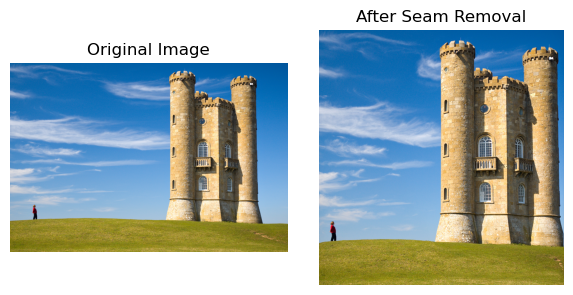

In [42]:
# Load the image
image_path = "images/castle.jpg"
im = cv2.imread(image_path)
im_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying with plt

# Perform vertical seam removal
num_seams_to_remove = 500
result, _ = seams_removal(im, num_seams_to_remove)

# Convert the result to RGB for displaying with plt
result_rgb = cv2.cvtColor(result.astype(np.uint8), cv2.COLOR_BGR2RGB)

# Display the original and processed images
images = [im_rgb, result_rgb]
titles = ["Original Image", "After Seam Removal"]
show_images(images, titles, 1, 2)


#### 2- Horizontal Seam Removal

(914, 912, 3)
(764, 912, 3)


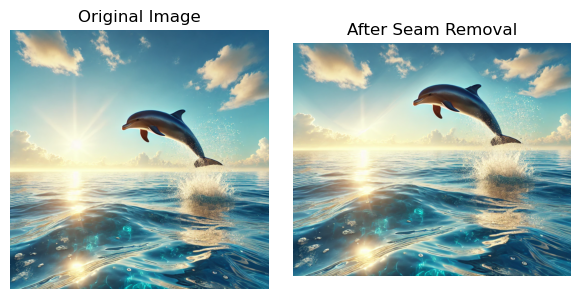

In [33]:
# Load the image
image_path = "images/dolphin.png"
im = cv2.imread(image_path)
im_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying with plt

# Rotate the image to work with horizontal seams as vertical seams
im_rotated = rotate_image(im, clockwise=True)  # Rotate 90 degrees clockwise

# Perform vertical seam removal on the rotated image
num_seams_to_remove = 150
result_rotated, _ = seams_removal(im_rotated, num_seams_to_remove)

# Rotate the result back to the original orientation
result = rotate_image(result_rotated, clockwise=False)  # Rotate 90 degrees counterclockwise

# Convert the result to RGB for displaying with plt
result_rgb = cv2.cvtColor(result.astype(np.uint8), cv2.COLOR_BGR2RGB)

print(im_rgb.shape)
print(result_rgb.shape)

# Display the original and processed images
images = [im_rgb, result_rgb]
titles = ["Original Image", "After Seam Removal"]
show_images(images, titles, 1, 2)


#### 3- Seam Removal with Protective Masks

(1080, 1920, 3)
(1080, 1420, 3)
(1080, 1420)


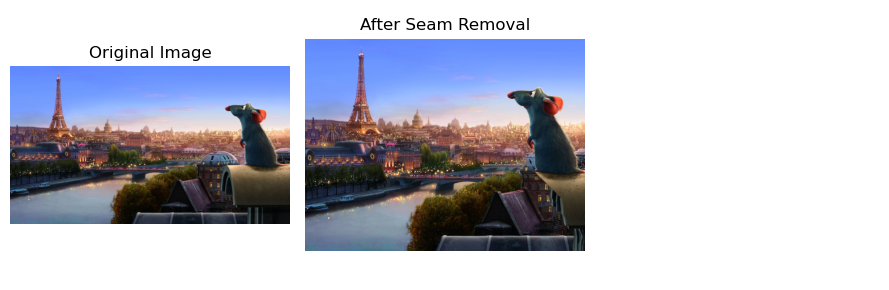

In [56]:
# Load the image and mask
image_path = "images/ratatouille.jpg"
mask_path = "images/ratatouille_mask.jpg"
im = cv2.imread(image_path)
im_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying with plt

# Load the mask
mask = cv2.imread(mask_path, 0)  # Load as grayscale

# Perform vertical seam removal
num_seams_to_remove = 500
result, result_mask = seams_removal(im, num_seams_to_remove, mask)

# Convert the result to RGB for displaying with plt
result_rgb = cv2.cvtColor(result.astype(np.uint8), cv2.COLOR_BGR2RGB)
print(im_rgb.shape)
print(result_rgb.shape)
print(result_mask.shape)
# Display the original and processed images
images = [im_rgb, result_rgb]
titles = ["Original Image", "After Seam Removal"]
show_images(images, titles, 1, 3)

#### 4- Seam Insertion

(2304, 1728, 3)
(2304, 2228, 3)


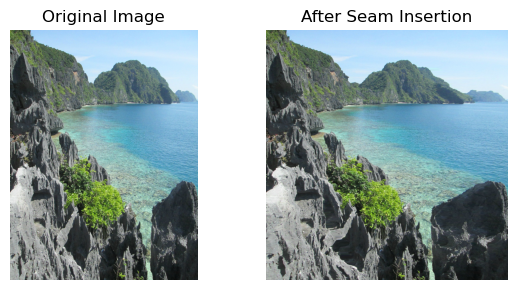

In [59]:
# Load the image
image_path = "images/shore.jpg"
im = cv2.imread(image_path)
im_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying with plt

# Determine the number of seams to insert
num_seams_to_add = 500  # Adjust this value as needed

# Perform seam insertion
result, _ = seams_insertion(im, num_seams_to_add)

# Convert the result to RGB for displaying with plt
result_rgb = cv2.cvtColor(result.astype(np.uint8), cv2.COLOR_BGR2RGB)

print(im_rgb.shape)
print(result_rgb.shape)

# Display the original and processed images
images = [im_rgb, result_rgb]
titles = ["Original Image", "After Seam Insertion"]
show_images(images, titles, 1, 2)


#### 5- Object Removal with Protective Masks

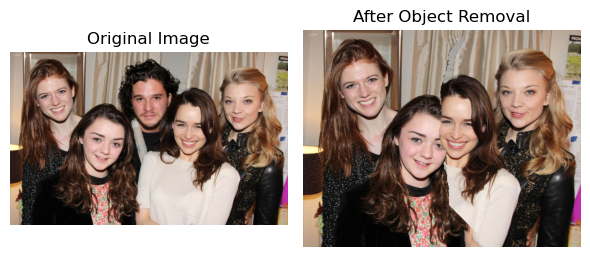

In [11]:
# Load the image and masks
image_path = "images/gotcast.jpg"
removal_mask_path = "images/got_removal_mask.jpg"
protective_mask_path = "images/got_protective_mask.jpg"

# Load the image
im = cv2.imread(image_path)

scale = 0.25       # half the original size

height = int(im.shape[0] * scale)
width  = int(im.shape[1] * scale)
dim = (width, height)

im = cv2.resize(im, dim)
im_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying with plt

# Load the removal mask
removal_mask = cv2.imread(removal_mask_path, 0)  # Load as grayscale
removal_mask = cv2.resize(removal_mask, dim)

# Load protective mask
protective_mask = cv2.imread(protective_mask_path, 0)  # Load as grayscale
protective_mask = cv2.resize(protective_mask, dim)

# Perform object removal with protective masks
result = object_removal(im, removal_mask, protective_mask, vis=True)

# Convert the result to RGB for displaying with plt
result_rgb = cv2.cvtColor(result.astype(np.uint8), cv2.COLOR_BGR2RGB)

# Display the original and processed images
images = [im_rgb, result_rgb]
titles = ["Original Image", "After Object Removal"]
show_images(images, titles, 1, 2)


# Template Matching

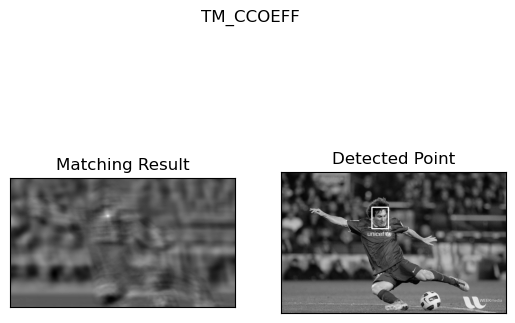

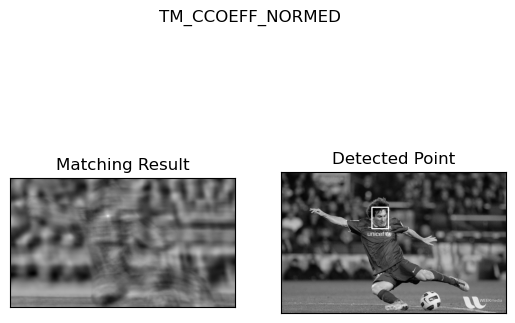

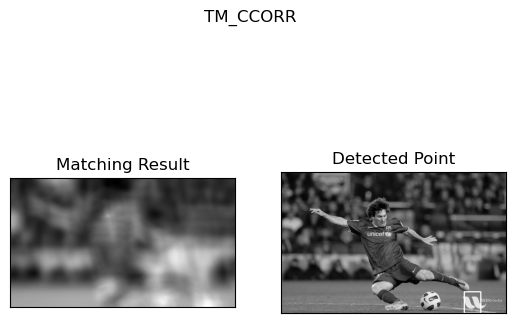

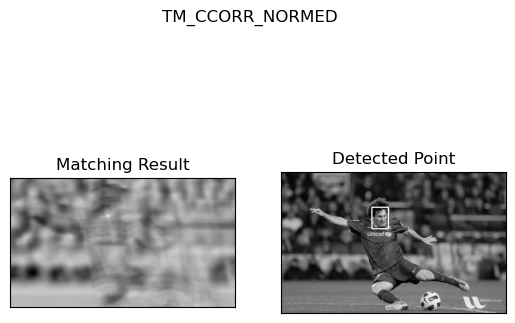

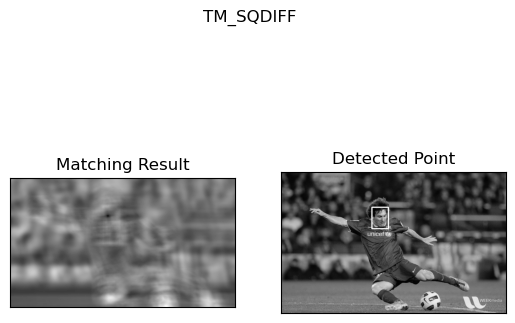

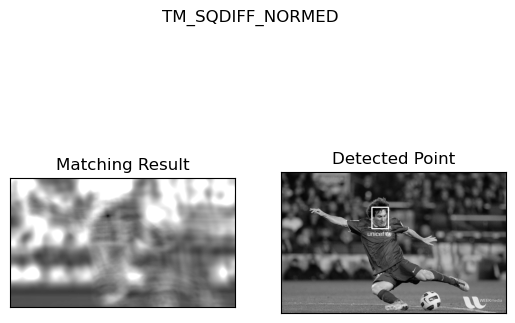

In [10]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
 
img = cv.imread('images/messi.jpg', cv.IMREAD_GRAYSCALE)
img2 = img.copy()
template = cv.imread('images/messi_face.jpg', cv.IMREAD_GRAYSCALE)

w, h = template.shape[::-1]
 
# All the 6 methods for comparison in a list
methods = ['TM_CCOEFF', 'TM_CCOEFF_NORMED', 'TM_CCORR',
 'TM_CCORR_NORMED', 'TM_SQDIFF', 'TM_SQDIFF_NORMED']
 
for meth in methods:
    img = img2.copy()
    method = getattr(cv, meth)
    
    # Apply template Matching
    res = cv.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    
    cv.rectangle(img,top_left, bottom_right, 255, 2)

    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)
    
    plt.show()

# Face and eye Detection using Haar Cascade Classifiers 

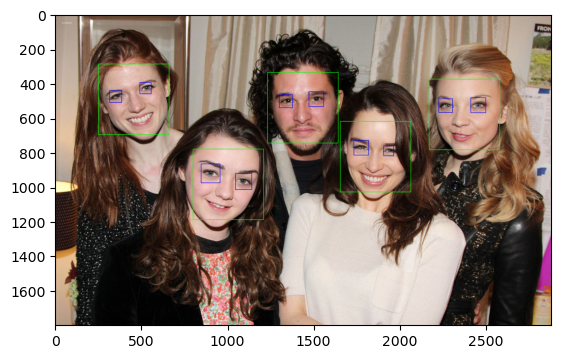

In [21]:
# Load the cascades
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

# Load the image
image = cv2.imread('images/gotcast.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.5, minNeighbors=10)

for (x, y, w, h) in faces:
    # Draw rectangle around the face
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
    # Region of interest for eyes
    roi_gray = gray[y:y + h, x:x + w]
    roi_color = image[y:y + h, x:x + w]
    
    # Detect eyes with adjusted thresholds
    eyes = eye_cascade.detectMultiScale(roi_gray, scaleFactor=1.1, minNeighbors=20)
    for (ex, ey, ew, eh) in eyes:
        # Draw rectangle around the eyes
        cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (255, 0, 0), 2)

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)

# Flood Fill

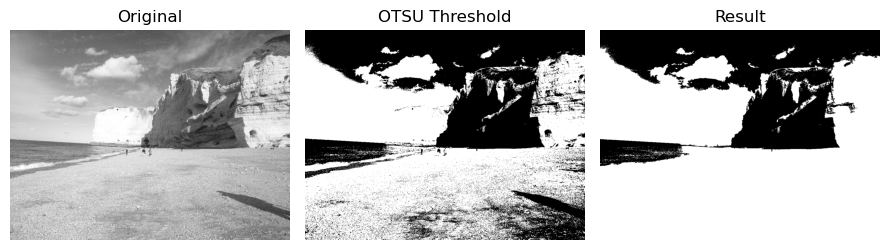

In [79]:
image = cv2.imread('images/sea.jpeg')
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

# Threshold the image to obtain a binary image
_, binary_image = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Copy the thresholded image
flood_filled_image = binary_image.copy()

# Create a mask for flood fill
h, w = binary_image.shape[:2]
mask = np.zeros((h+2, w+2), np.uint8)

# Perform flood fill from point (0, 0)
cv2.floodFill(flood_filled_image, mask, (0, 0), 255)

# Invert the flood filled image
flood_filled_image_inv = cv2.bitwise_not(flood_filled_image)

# Combine the binary image and the inverted flood filled image
result_image = binary_image | flood_filled_image_inv

show_images([gray, binary_image, result_image],["Original", "OTSU Threshold", "Result"], 1, 3)

# Connected Component Segmentation

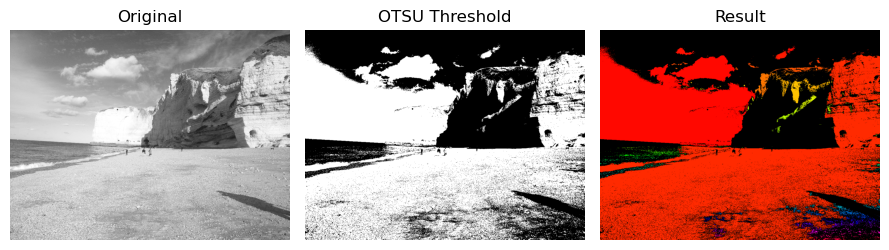

In [86]:
image = cv2.imread('images/sea.jpeg', cv2.IMREAD_GRAYSCALE)

# Threshold the image to get a binary image
_, binary_image = cv2.threshold(image,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Perform connected components analysis
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary_image, connectivity=8)

# Map component labels to hue values
label_hue = np.uint8(179 * labels / np.max(labels))
blank_ch = 255 * np.ones_like(label_hue)
labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

# Convert to BGR for display
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

# Set background label to black
labeled_img[label_hue == 0] = 0
labeled_img = cv2.cvtColor(labeled_img,cv2.COLOR_BGR2RGB)

show_images([image, binary_image, labeled_img],["Original", "OTSU Threshold", "Result"], 1, 3)

# K-means Segmentation

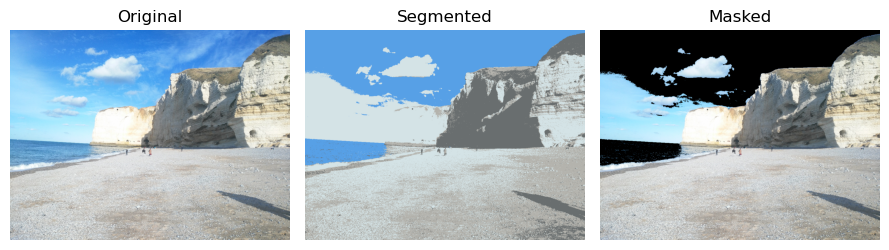

In [90]:
image = cv2.imread('images/sea.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Reshape the image to a 2D array of pixels and 3 color values (RGB)
pixel_values = image.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

# Define the criteria for the algorithm
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

# Number of clusters (K)
k = 4
_, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, attempts=10, flags=cv2.KMEANS_PP_CENTERS)
'''
attempts: specifies the number of times the algorithm is executed using different initial labellings
flags:    specifies how initial centers are chosen. The common flags are:
               cv2.KMEANS_RANDOM_CENTERS: Centers are chosen randomly.
               cv2.KMEANS_PP_CENTERS: Centers are chosen according to the k-means++ algorithm, which tends to result in better clustering results.
'''

# Convert back to 8-bit values
centers = np.uint8(centers)

# Flatten the labels array
labels = labels.flatten()

# Convert all pixels to the color of the centroids
segmented_image = centers[labels]

# Reshape back to the original image dimension
segmented_image = segmented_image.reshape(image.shape)

# Optional: Disable a specific cluster to highlight segments
cluster_to_disable = 2
masked_image = np.copy(image)
masked_image = masked_image.reshape((-1, 3))
masked_image[labels == cluster_to_disable] = [0, 0, 0]
masked_image = masked_image.reshape(image.shape)

show_images([image, segmented_image, masked_image],["Original", "Segmented", "Masked"], 1, 3)

# K-means Segmentation with The Elbow Method

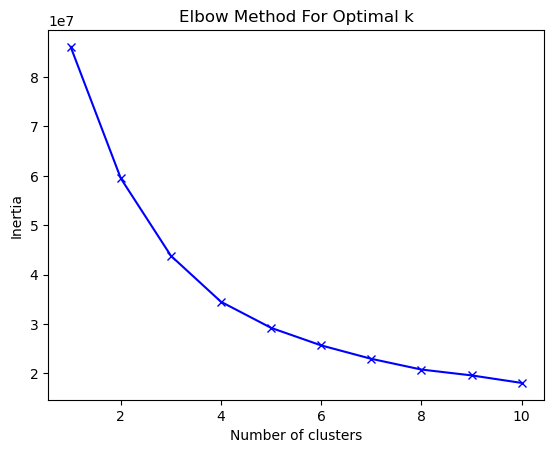

Optimal number of clusters: 4


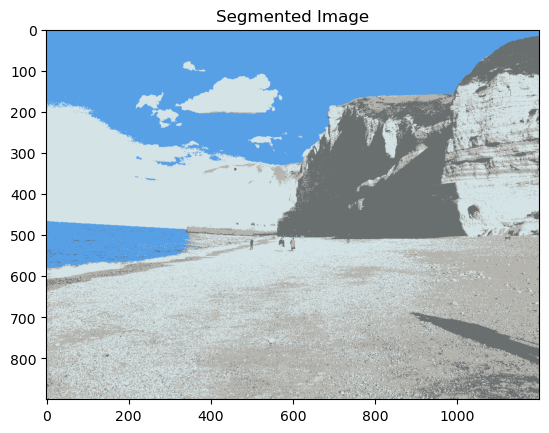

In [93]:
from kneed import KneeLocator

image = cv2.imread('images/sea.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Reshape the image to a 2D array of pixels and 3 color values (RGB)
pixel_values = image.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

# Define the criteria for the algorithm
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

# Function to calculate inertia for different values of k
def calculate_inertia(pixel_values, max_k=10):
    inertia_values = []
    for k in range(1, max_k + 1):
        _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
        inertia = 0
        for i in range(len(pixel_values)):
            inertia += np.linalg.norm(pixel_values[i] - centers[labels[i]])
        inertia_values.append(inertia)
    return inertia_values

# Calculate inertia for k values from 1 to 10
inertia_values = calculate_inertia(pixel_values, max_k=10)

# Plot the inertia values to find the elbow
k_values = range(1, 11)
plt.plot(k_values, inertia_values, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')
plt.show()

# Find the elbow point
def find_elbow_point(inertia_values):
    k_values = range(1, len(inertia_values) + 1)
    kn = KneeLocator(k_values, inertia_values, curve='convex', direction='decreasing')
    return kn.knee

# Determine the optimal number of clusters using the elbow method
optimal_k = find_elbow_point(inertia_values)
print(f'Optimal number of clusters: {optimal_k}')

# Perform K-Means clustering with the optimal number of clusters
_, labels, centers = cv2.kmeans(pixel_values, optimal_k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Convert back to 8-bit values
centers = np.uint8(centers)

# Flatten the labels array
labels = labels.flatten()

# Convert all pixels to the color of the centroids
segmented_image = centers[labels]

# Reshape back to the original image dimension
segmented_image = segmented_image.reshape(image.shape)

# Display the segmented image
plt.imshow(segmented_image)
plt.title('Segmented Image')
plt.show()


# segmentation using Gaussian Mixture Models (GMM) and the Expectation-Maximization (EM)

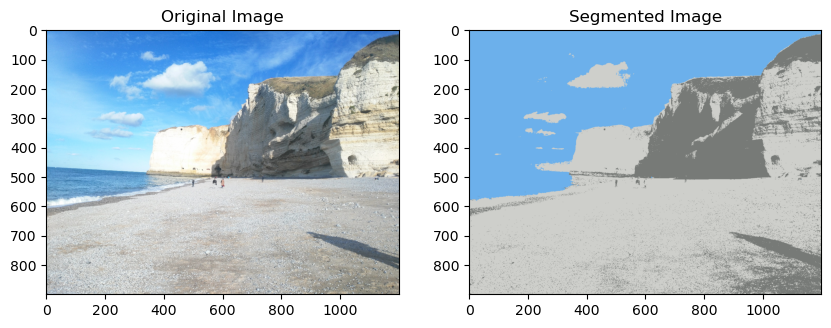

In [94]:
from sklearn.mixture import GaussianMixture

# Read the image
image = cv2.imread('images/sea.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Reshape the image to a 2D array of pixels and 3 color values (RGB)
pixel_values = image.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

# Apply Gaussian Mixture Model
gmm = GaussianMixture(n_components=3, covariance_type='tied', random_state=42)
'''
n_components: The number of mixture components (i.e., Gaussian distributions) to fit.
covariance_type: Specifies the type of covariance parameters to use.
    Options:
        'full': Each component has its own general covariance matrix.
        'tied': All components share the same general covariance matrix.
        'diag': Each component has its own diagonal covariance matrix.
        'spherical': Each component has its own single variance.
tol: The convergence threshold. EM iterations will stop when the log-likelihood gain is below this threshold.
max_iter: The maximum number of EM iterations to perform
n_init: The number of initializations to perform. The best result is kept.
init_params: The method used to initialize the weights, the means, and the precisions.
    Options: 'kmeans' or 'random'.
random_state: The seed used by the random number generator. Ensures reproducibility
'''
gmm.fit(pixel_values)

# Predict the labels for each pixel
labels = gmm.predict(pixel_values)

# Reshape the labels to the original image shape
segmented_image = labels.reshape(image.shape[0], image.shape[1])

# Map the labels to colors
unique_labels = np.unique(labels)
segmented_image_rgb = np.zeros_like(image)
for label in unique_labels:
    segmented_image_rgb[segmented_image == label] = gmm.means_[label]

# Convert the segmented image back to uint8
segmented_image_rgb = np.uint8(segmented_image_rgb)

# Display the original and segmented images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)

plt.subplot(1, 2, 2)
plt.title('Segmented Image')
plt.imshow(segmented_image_rgb)
plt.show()


# Image Stitching (Panoramas)

In [6]:
# https://github.com/SSARCandy/panoramas-image-stitching/tree/master

import multiprocess as mp
import os
import math

# Constants
DEBUG = False
FEATURE_THRESHOLD = 0.01
DESCRIPTOR_SIZE = 5
MATCHING_Y_RANGE = 30
RANSAC_K = 1000
RANSAC_THRES_DISTANCE = 3
ALPHA_BLEND_WINDOW = 2
FEATURE_CUT_X_EDGE = 10
FEATURE_CUT_Y_EDGE = 50

# Feature extraction and matching functions
def compute_r(xx_row, yy_row, xy_row, k):
    import numpy as np
    row_response = np.zeros(shape=xx_row.shape, dtype=np.float32)
    for x in range(len(xx_row)):
        det_M = xx_row[x] * yy_row[x] - xy_row[x] ** 2
        trace_M = xx_row[x] + yy_row[x]
        R = det_M - k * trace_M ** 2
        row_response[x] = R
    return row_response

def harris_corner(img, pool, k=0.04, block_size=2):
    import numpy as np
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray) / 255
    height, width = gray.shape
    dx = cv2.Sobel(gray, -1, 1, 0)
    dy = cv2.Sobel(gray, -1, 0, 1)
    Ixx = dx * dx
    Iyy = dy * dy
    Ixy = dx * dy
    cov_xx = cv2.boxFilter(Ixx, -1, (block_size, block_size), normalize=False)
    cov_yy = cv2.boxFilter(Iyy, -1, (block_size, block_size), normalize=False)
    cov_xy = cv2.boxFilter(Ixy, -1, (block_size, block_size), normalize=False)
    corner_response = pool.starmap(compute_r, [(cov_xx[y], cov_yy[y], cov_xy[y], k) for y in range(height)])
    return np.asarray(corner_response)

def extract_description(img, corner_response, threshold=0.01, kernel=3):
    height, width = corner_response.shape
    features = np.zeros(shape=(height, width), dtype=np.uint8)
    features[corner_response > threshold * corner_response.max()] = 255
    features[:FEATURE_CUT_Y_EDGE, :] = 0  
    features[-FEATURE_CUT_Y_EDGE:, :] = 0
    features[:, -FEATURE_CUT_X_EDGE:] = 0
    features[:, :FEATURE_CUT_X_EDGE] = 0
    window = 3
    for y in range(0, height - 10, window):
        for x in range(0, width - 10, window):
            if features[y:y + window, x:x + window].sum() == 0:
                continue
            block = corner_response[y:y + window, x:x + window]
            max_y, max_x = np.unravel_index(np.argmax(block), (window, window))
            features[y:y + window, x:x + window] = 0
            features[y + max_y][x + max_x] = 255
    feature_positions = []
    feature_descriptions = np.zeros(shape=(1, kernel ** 2), dtype=np.float32)
    half_k = kernel // 2
    for y in range(half_k, height - half_k):
        for x in range(half_k, width - half_k):
            if features[y][x] == 255:
                feature_positions += [[y, x]]
                desc = corner_response[y - half_k:y + half_k + 1, x - half_k:x + half_k + 1]
                feature_descriptions = np.append(feature_descriptions, [desc.flatten()], axis=0)
    return feature_descriptions[1:], feature_positions

def compute_match(descriptor1, descriptor2, feature_position1, feature_position2, y_range=10):
    import numpy as np
    matched_pairs = []
    matched_pairs_rank = []
    for i in range(len(descriptor1)):
        distances = []
        y = feature_position1[i][0]
        for j in range(len(descriptor2)):
            diff = float('Inf')
            if y - y_range <= feature_position2[j][0] <= y + y_range:
                diff = descriptor1[i] - descriptor2[j]
                diff = (diff ** 2).sum()
            distances += [diff]
        sorted_index = np.argpartition(distances, 1)
        local_optimal = distances[sorted_index[0]]
        local_optimal2 = distances[sorted_index[1]]
        if local_optimal > local_optimal2:
            local_optimal, local_optimal2 = local_optimal2, local_optimal
        if local_optimal / local_optimal2 <= 0.5:
            paired_index = np.where(distances == local_optimal)[0][0]
            pair = [feature_position1[i], feature_position2[paired_index]]
            matched_pairs += [pair]
            matched_pairs_rank += [local_optimal]
    sorted_rank_idx = np.argsort(matched_pairs_rank)
    sorted_match_pairs = np.asarray(matched_pairs)
    sorted_match_pairs = sorted_match_pairs[sorted_rank_idx]
    refined_matched_pairs = []
    for item in sorted_match_pairs:
        duplicated = False
        for refined_item in refined_matched_pairs:
            if refined_item[1] == list(item[1]):
                duplicated = True
                break
        if not duplicated:
            refined_matched_pairs += [item.tolist()]
    return refined_matched_pairs

def matching(descriptor1, descriptor2, feature_position1, feature_position2, pool, y_range=10):
    import numpy as np
    TASKS_NUM = 32
    partition_descriptors = np.array_split(descriptor1, TASKS_NUM)
    partition_positions = np.array_split(feature_position1, TASKS_NUM)
    sub_tasks = [(partition_descriptors[i], descriptor2, partition_positions[i], feature_position2, y_range) for i in range(TASKS_NUM)]
    results = pool.starmap(compute_match, sub_tasks)
    matched_pairs = []
    for res in results:
        if len(res) > 0:
            matched_pairs += res
    return matched_pairs

# Stitching functions
def RANSAC(matched_pairs, prev_shift):
    matched_pairs = np.asarray(matched_pairs)
    use_random = True if len(matched_pairs) > RANSAC_K else False
    best_shift = []
    K = RANSAC_K if use_random else len(matched_pairs)
    threshold_distance = RANSAC_THRES_DISTANCE
    max_inliner = 0
    for k in range(K):
        idx = int(np.random.random_sample() * len(matched_pairs)) if use_random else k
        sample = matched_pairs[idx]
        shift = sample[1] - sample[0]
        shifted = matched_pairs[:, 1] - shift
        difference = matched_pairs[:, 0] - shifted
        inliner = 0
        for diff in difference:
            if np.sqrt((diff ** 2).sum()) < threshold_distance:
                inliner += 1
        if inliner > max_inliner:
            max_inliner = inliner
            best_shift = shift
    if prev_shift[1] * best_shift[1] < 0:
        print('\n\nBest shift:', best_shift)
        raise ValueError('Shift direction NOT same as previous shift.')
    return best_shift

def stitching(img1, img2, shift, pool, blending=True):
    import numpy as np
    padding = [
        (shift[0], 0) if shift[0] > 0 else (0, -shift[0]),
        (shift[1], 0) if shift[1] > 0 else (0, -shift[1]),
        (0, 0)
    ]
    shifted_img1 = np.lib.pad(img1, padding, 'constant', constant_values=0)
    split = img2.shape[1] + abs(shift[1])
    splited = shifted_img1[:, split:] if shift[1] > 0 else shifted_img1[:, :-split]
    shifted_img1 = shifted_img1[:, :split] if shift[1] > 0 else shifted_img1[:, -split:]
    h1, w1, _ = shifted_img1.shape
    h2, w2, _ = img2.shape
    inv_shift = [h1 - h2, w1 - w2]
    inv_padding = [
        (inv_shift[0], 0) if shift[0] < 0 else (0, inv_shift[0]),
        (inv_shift[1], 0) if shift[1] < 0 else (0, inv_shift[1]),
        (0, 0)
    ]
    shifted_img2 = np.lib.pad(img2, inv_padding, 'constant', constant_values=0)
    direction = 'left' if shift[1] > 0 else 'right'
    if blending:
        seam_x = shifted_img1.shape[1] // 2
        tasks = [(shifted_img1[y], shifted_img2[y], seam_x, ALPHA_BLEND_WINDOW, direction) for y in range(h1)]
        shifted_img1 = pool.starmap(alpha_blend, tasks)
        shifted_img1 = np.asarray(shifted_img1)
        shifted_img1 = np.concatenate((shifted_img1, splited) if shift[1] > 0 else (splited, shifted_img1), axis=1)
    else:
        raise ValueError('I did not implement "blending=False" ^_^')
    return shifted_img1

def alpha_blend(row1, row2, seam_x, window, direction='left'):
    import numpy as np
    if direction == 'right':
        row1, row2 = row2, row1
    new_row = np.zeros(shape=row1.shape, dtype=np.uint8)
    for x in range(len(row1)):
        color1 = row1[x]
        color2 = row2[x]
        if x < seam_x - window:
            new_row[x] = color2
        elif x > seam_x + window:
            new_row[x] = color1
        else:
            ratio = (x - seam_x + window) / (window * 2)
            new_row[x] = (1 - ratio) * color2 + ratio * color1
    return new_row

def end2end_align(img, shifts):
    sum_y, sum_x = np.sum(shifts, axis=0)
    y_shift = np.abs(sum_y)
    col_shift = None
    if sum_x * sum_y > 0:
        col_shift = np.linspace(y_shift, 0, num=img.shape[1], dtype=np.uint16)
    else:
        col_shift = np.linspace(0, y_shift, num=img.shape[1], dtype=np.uint16)
    aligned = img.copy()
    for x in range(img.shape[1]):
        aligned[:, x] = np.roll(img[:, x], col_shift[x], axis=0)
    return aligned

def crop(img):
    _, thresh = cv2.threshold(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 1, 255, cv2.THRESH_BINARY)
    upper, lower = [-1, -1]
    black_pixel_num_threshold = img.shape[1] // 100
    for y in range(thresh.shape[0]):
        if len(np.where(thresh[y] == 0)[0]) < black_pixel_num_threshold:
            upper = y
            break
    for y in range(thresh.shape[0] - 1, 0, -1):
        if len(np.where(thresh[y] == 0)[0]) < black_pixel_num_threshold:
            lower = y
            break
    return img[upper:lower, :]

def load_images(source_dir):
    imgs = []
    for (dirpath, dirnames, filenames) in os.walk(source_dir):
        imgs.extend([filename for filename in filenames if filename.endswith('.jpg') or filename.endswith('.png')])
        break
    image_list = [cv2.imread(os.path.join(source_dir, img), 1) for img in imgs]
    return image_list

def cylindrical_projection(img, focal_length):
    import numpy as np
    import cv2
    import math
    height, width, _ = img.shape
    cylinder_proj = np.zeros(shape=img.shape, dtype=np.uint8)
    for y in range(-int(height / 2), int(height / 2)):
        for x in range(-int(width / 2), int(width / 2)):
            cylinder_x = focal_length * math.atan(x / focal_length)
            cylinder_y = focal_length * y / math.sqrt(x ** 2 + focal_length ** 2)
            cylinder_x = round(cylinder_x + width / 2)
            cylinder_y = round(cylinder_y + height / 2)
            if cylinder_x >= 0 and cylinder_x < width and cylinder_y >= 0 and cylinder_y < height:
                cylinder_proj[cylinder_y][cylinder_x] = img[y + int(height / 2)][x + int(width / 2)]
    _, thresh = cv2.threshold(cv2.cvtColor(cylinder_proj, cv2.COLOR_BGR2GRAY), 1, 255, cv2.THRESH_BINARY)
    x, y, w, h = cv2.boundingRect(thresh)
    return cylinder_proj[y:y + h, x:x + w]

def parse(source_dir):
    filenames = []
    focal_length = []
    with open(os.path.join(source_dir, 'image_list.txt')) as f:
        for line in f:
            if line[0] == '#':
                continue
            filename, focal_length_value, *rest = line.split()
            filenames.append(filename)
            focal_length.append(float(focal_length_value))
    img_list = [cv2.imread(os.path.join(source_dir, f), 1) for f in filenames]
    return img_list, focal_length

# Main stitching function
def stitch_images(source_dir):
    pool = mp.Pool(mp.cpu_count())
    
    # Parse images and focal lengths
    image_list, focal_lengths = parse(source_dir)
    
    cylinder_img_list = pool.starmap(cylindrical_projection, [(image_list[i], focal_lengths[i]) for i in range(len(image_list))])
    
    _, img_width, _ = image_list[0].shape
    stitched_image = cylinder_img_list[0].copy()
    shifts = [[0, 0]]
    cache_feature = [[], []]

    for i in range(1, len(cylinder_img_list)):
        img1 = cylinder_img_list[i - 1]
        img2 = cylinder_img_list[i]
        descriptors1, position1 = cache_feature
        if len(descriptors1) == 0:
            corner_response1 = harris_corner(img1, pool)
            descriptors1, position1 = extract_description(img1, corner_response1, kernel=DESCRIPTOR_SIZE, threshold=FEATURE_THRESHOLD)
        corner_response2 = harris_corner(img2, pool)
        descriptors2, position2 = extract_description(img2, corner_response2, kernel=DESCRIPTOR_SIZE, threshold=FEATURE_THRESHOLD)
        cache_feature = [descriptors2, position2]
        matched_pairs = matching(descriptors1, descriptors2, position1, position2, pool, y_range=MATCHING_Y_RANGE)
        shift = RANSAC(matched_pairs, shifts[-1])
        shifts += [shift]
        stitched_image = stitching(stitched_image, img2, shift, pool, blending=True)

    aligned = end2end_align(stitched_image, shifts)
    cropped = crop(aligned)
    
    pool.close()
    pool.join()
    
    return cropped

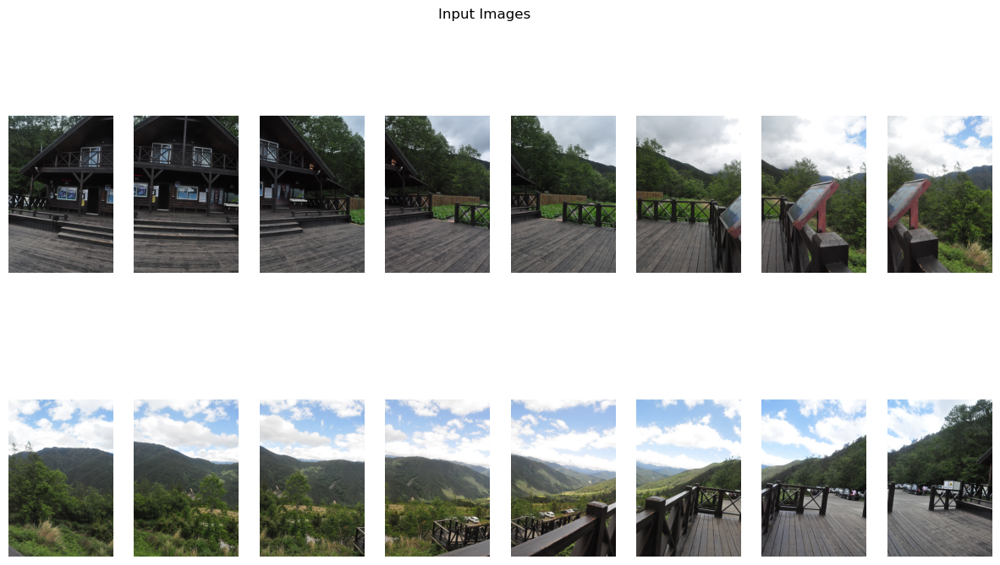

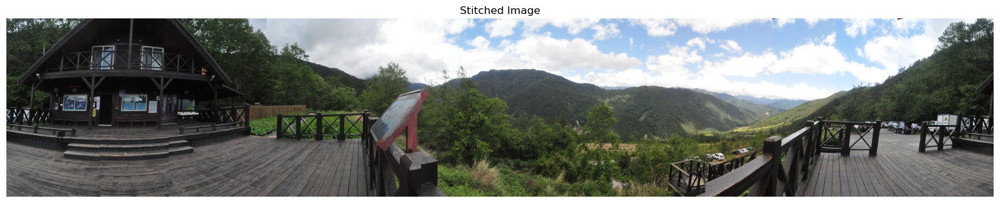

In [4]:
source_dir = 'images/Xue-Mountain-Enterance'

def plot_images(images, num_rows=2):
    num_images = len(images)
    num_cols = (num_images + num_rows - 1) // num_rows
    
    plt.figure(figsize=(15, 8))
    for i, img in enumerate(images):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
    plt.suptitle('Input Images')
    plt.show()

# Load and plot input images
image_list, _ = parse(source_dir)
plot_images(image_list)

# Stitch images and plot the result
result = stitch_images(source_dir)
if result is not None:
    plt.figure(figsize=(20, 14))
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title('Stitched Image')
    plt.axis('off')
    plt.show()
else:
    print("Image stitching failed.")

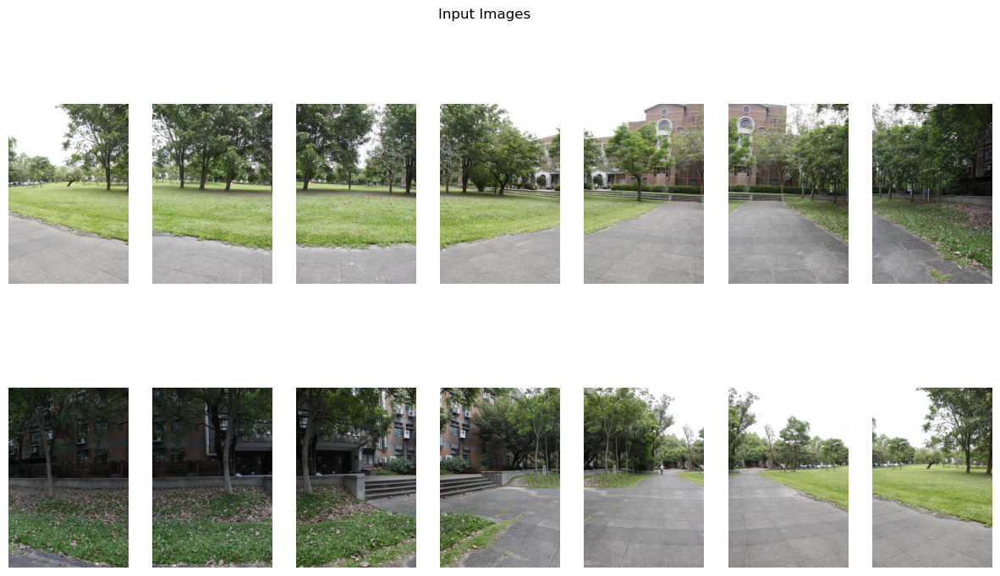

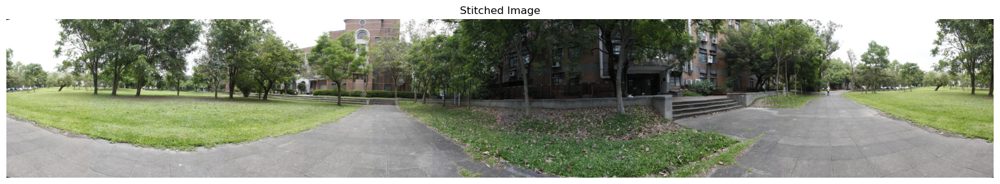

In [5]:
source_dir = 'images/library'

def plot_images(images, num_rows=2):
    num_images = len(images)
    num_cols = (num_images + num_rows - 1) // num_rows
    
    plt.figure(figsize=(15, 8))
    for i, img in enumerate(images):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
    plt.suptitle('Input Images')
    plt.show()

# Load and plot input images
image_list, _ = parse(source_dir)
plot_images(image_list)

# Stitch images and plot the result
result = stitch_images(source_dir)
if result is not None:
    plt.figure(figsize=(20, 14))
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title('Stitched Image')
    plt.axis('off')
    plt.show()
else:
    print("Image stitching failed.")

# DBSCAN clustering

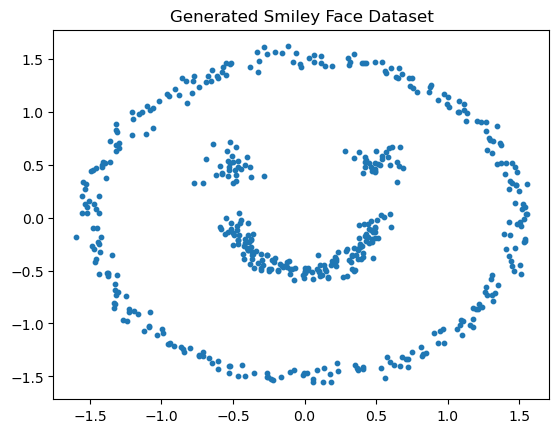

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

def generate_smiley_face():
    # Parameters
    n = 300
    noise = 0.05

    # Generate circle (face)
    theta = np.linspace(0, 2 * np.pi, n)
    x_face = 1.5 * np.cos(theta) + noise * np.random.randn(n)
    y_face = 1.5 * np.sin(theta) + noise * np.random.randn(n)

    # Generate eyes
    x_eye1 = -0.5 + 0.1 * np.random.randn(n // 10)
    y_eye1 = 0.5 + 0.1 * np.random.randn(n // 10)
    x_eye2 = 0.5 + 0.1 * np.random.randn(n // 10)
    y_eye2 = 0.5 + 0.1 * np.random.randn(n // 10)

    # Generate mouth
    theta = np.linspace(0, np.pi, n // 2)
    x_mouth = 0.5 * np.cos(theta) + noise * np.random.randn(n // 2)
    y_mouth = -0.5 * np.sin(theta) + noise * np.random.randn(n // 2)

    # Combine all parts
    x = np.concatenate((x_face, x_eye1, x_eye2, x_mouth))
    y = np.concatenate((y_face, y_eye1, y_eye2, y_mouth))

    return np.vstack((x, y)).T

# Generate the smiley face dataset
smiley_face = generate_smiley_face()

# Plot the smiley face dataset
plt.scatter(smiley_face[:, 0], smiley_face[:, 1], s=10)
plt.title('Generated Smiley Face Dataset')
plt.show()


Estimated number of clusters: 4
Estimated number of noise points: 0


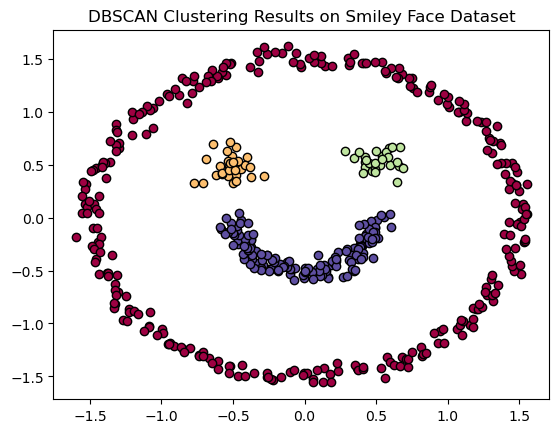

In [13]:
# Perform DBSCAN
db = DBSCAN(eps=0.15, min_samples=2).fit(smiley_face)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print(f'Estimated number of clusters: {n_clusters_}')
print(f'Estimated number of noise points: {n_noise_}')

# Plot DBSCAN results
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = smiley_face[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=6)

plt.title('DBSCAN Clustering Results on Smiley Face Dataset')
plt.show()
